In [1]:
!pip install Twython
import pandas as pd
import numpy as np 
from twython import Twython
import requests
from bs4 import BeautifulSoup
from datetime import datetime
import ast
import time
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
plt.style.use('ggplot')

CONSUMER_KEY = "DyoTjohC4arsxLFBjmh71l5Fi"
CONSUMER_SECRET = "sWE3WV27dOOsZnRpSo19bZCojZykVqftYh1uAQvCwqviro4jT1"
OAUTH_TOKEN = "1133494860554604545-aQrvZDpNyxgi6MwQbHegX8Bkx6CUfI"
OAUTH_TOKEN_SECRET = "inqueIKTVIqqKGXKiHS7dOwNvSmCQdWgYN83ih1kQkNkS"
twitter = Twython(
    CONSUMER_KEY, CONSUMER_SECRET,
    OAUTH_TOKEN, OAUTH_TOKEN_SECRET)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Θανάσης Αυγερινός
# https://twitter.com/AvgerinosMoscow

In [2]:
Avger = []
try:
    user_timeline = twitter.get_user_timeline(screen_name='AvgerinosMoscow',count=300, tweet_mode = 'extended'  )
except TwythonError as e:
    print("Error getting tweets:", e)
print("I Got:", len(user_timeline), " tweets")
for tweet in user_timeline:
    # Add whatever you want from the tweet, here we just add the text
    Avger.append(tweet)

I Got: 200  tweets


In [3]:
pd.DataFrame(Avger)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,favorited,retweeted,lang,extended_entities,possibly_sensitive,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
0,Sun Jul 03 13:54:35 +0000 2022,1543594052377092097,1543594052377092097,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...",False,"[13, 61]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",1.543589e+18,1543588684334784515,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sun Jul 03 13:31:38 +0000 2022,1543588276413538307,1543588276413538307,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...,False,"[13, 224]","{'hashtags': [{'text': 'ΝΑΤΟ', 'indices': [92,...","<a href=""http://twitter.com/download/android"" ...",1.543587e+18,1543586834193813504,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Sun Jul 03 13:10:51 +0000 2022,1543583045894168576,1543583045894168576,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...,False,"[0, 286]","{'hashtags': [{'text': 'Lugansk', 'indices': [...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,False,False,el,"{'media': [{'id': 1543582964717682688, 'id_str...",False,NaN,NaN,NaN,NaN,NaN
3,Sun Jul 03 11:30:30 +0000 2022,1543557794523189250,1543557794523189250,@PagourasPas Λέγονται και στρατηγοί του καναπέ...,False,"[13, 163]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",1.543508e+18,1543508083606962179,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Sun Jul 03 11:28:16 +0000 2022,1543557229642670080,1543557229642670080,@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...,False,"[10, 175]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",1.543502e+18,1543501882387308545,...,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Thu Jun 16 19:15:52 +0000 2022,1537514312750837762,1537514312750837762,"Έκανα σαρδάμ, Σεβεροντανιετσκ εννοώ φυσικά, εκ...",False,"[0, 279]","{'hashtags': [{'text': 'Azot', 'indices': [69,...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,False,False,el,NaN,False,NaN,1.537492e+18,1537491612347117570,"{'url': 'https://t.co/9hviYsLDKX', 'expanded':...",{'created_at': 'Thu Jun 16 17:45:40 +0000 2022...
196,Thu Jun 16 19:11:54 +0000 2022,1537513314036621313,1537513314036621313,RT @OpenNewsGr: Λαβρόφ: «Δεν είναι προτεραιότη...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,False,False,el,NaN,NaN,{'created_at': 'Thu Jun 16 17:45:40 +0000 2022...,NaN,NaN,NaN,NaN
197,Thu Jun 16 00:56:06 +0000 2022,1537237546341568513,1537237546341568513,RT @RWApodcast: That's... a lot. Higher than I...,False,"[0, 57]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,False,False,en,NaN,NaN,{'created_at': 'Wed Jun 15 22:01:55 +0000 2022...,1.537125e+18,1537125331336843266,"{'url': 'https://t.co/mYMvkRvPPV', 'expanded':...",NaN
198,Thu Jun 16 00:52:53 +0000 2022,1537236739227414528,1537236739227414528,Mου φαίνονται πολύ περίεργα &amp; θλιβερά αυτά...,False,"[0, 277]","{'hashtags': [{'text': 'Donetsk', 'indices': [...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,False,False,el,NaN,False,NaN,1.537045e+18,1537044634291032068,"{'url': 'https://t.co/MwbLfjmYyX', 'expanded':...",NaN


In [4]:
# Count could be less than 200, see:
# https://dev.twitter.com/discussions/7513
while len(user_timeline) != 0: 
    try:
        user_timeline = twitter.get_user_timeline(screen_name='AvgerinosMoscow',count=100,
                                                  tweet_mode = 'extended', max_id=user_timeline[len(user_timeline)-1]['id']-1)
    except TwythonError as e:
        print("Error getting tweets:", e)
    if len(user_timeline) > 0:
        print("I Got:", len(user_timeline), " tweets more... Last ID:", user_timeline[len(user_timeline)-1]['id']-1)
    for tweet in user_timeline:
        # Add whatever you want from the tweet, here we just add the text
        Avger.append(tweet)
# Number of tweets the user has made
print("I got :", len(Avger), " in total!!!")

I Got: 100  tweets more... Last ID: 1533188186792394751
I Got: 99  tweets more... Last ID: 1528822861074509823
I Got: 100  tweets more... Last ID: 1526094875476770815
I Got: 99  tweets more... Last ID: 1519662897227567103
I Got: 100  tweets more... Last ID: 1516458539669151749
I Got: 100  tweets more... Last ID: 1512748433475575809
I Got: 97  tweets more... Last ID: 1508078988547162114
I Got: 100  tweets more... Last ID: 1502882393677611008
I Got: 94  tweets more... Last ID: 1497810069064499199
I Got: 94  tweets more... Last ID: 1493618482096791552
I Got: 96  tweets more... Last ID: 1490100454285578242
I Got: 96  tweets more... Last ID: 1482909064308965377
I Got: 95  tweets more... Last ID: 1470073408902033410
I Got: 99  tweets more... Last ID: 1449477648065892355
I Got: 100  tweets more... Last ID: 1430778826817249280
I Got: 100  tweets more... Last ID: 1413472796815015936
I Got: 99  tweets more... Last ID: 1404838861759553541
I Got: 100  tweets more... Last ID: 1397506741827407876
I 

In [5]:
# Number of tweets the user has made
print("I got :", len(Avger), " in total!!!")

I got : 3205  in total!!!


In [6]:
for tweet in Avger:
    print(tweet['created_at'],tweet['full_text'])

Sun Jul 03 13:54:35 +0000 2022 @JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μας διαβάζουν...
Sun Jul 03 13:31:38 +0000 2022 @JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα, που εξατμίζεται ο φανατισμός και η ορμητική #ΝΑΤΟ-ϊκή προπαγάνδα, γίνονται κάποια πράγματα πιο καθαρά για τους πολλούς, που δεν είχαν σαφή εικόνα και πληροφορίες... #Ukrainewar
Sun Jul 03 13:10:51 +0000 2022 Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης ΛΔ του #Lugansk για το τι συμβαίνει στην πόλη που έχουν εγκαταλείψει οι δυνάμεις του #Kiev: βομβαρδιζόταν ως το τέλος (την πτώση &amp; του #Lisitchansk χθες) για να μείνει "καμμένη γη" &amp; ακόμη πιο εξαθλιωμένοι κάτοικοι στη ρωσική πλευρά. https://t.co/0papBcQCYv
Sun Jul 03 11:30:30 +0000 2022 @PagourasPas Λέγονται και στρατηγοί του καναπέως αυτοί που ξέρουν και διατάζουν τα πολλά και αποφασιστικά, που θέλουν κλιμάκωση, κήρυξη γενικευμένου πολέμου κ.ο.κ.
Sun Jul 03 11:28:16 +0000 2022 @mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νεκροί είναι Ουκρανοί, ο 1 Ρώσος, επομέ

In [7]:
#Avger[0]

In [8]:
Avger_df = pd.DataFrame(Avger)
Avger_df

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,lang,extended_entities,possibly_sensitive,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status,withheld_scope,withheld_in_countries
0,Sun Jul 03 13:54:35 +0000 2022,1543594052377092097,1543594052377092097,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...",False,"[13, 61]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",1.543589e+18,1543588684334784515,...,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Sun Jul 03 13:31:38 +0000 2022,1543588276413538307,1543588276413538307,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...,False,"[13, 224]","{'hashtags': [{'text': 'ΝΑΤΟ', 'indices': [92,...","<a href=""http://twitter.com/download/android"" ...",1.543587e+18,1543586834193813504,...,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Sun Jul 03 13:10:51 +0000 2022,1543583045894168576,1543583045894168576,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...,False,"[0, 286]","{'hashtags': [{'text': 'Lugansk', 'indices': [...","<a href=""http://twitter.com/download/android"" ...",NaN,None,...,el,"{'media': [{'id': 1543582964717682688, 'id_str...",False,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Sun Jul 03 11:30:30 +0000 2022,1543557794523189250,1543557794523189250,@PagourasPas Λέγονται και στρατηγοί του καναπέ...,False,"[13, 163]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",1.543508e+18,1543508083606962179,...,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Sun Jul 03 11:28:16 +0000 2022,1543557229642670080,1543557229642670080,@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...,False,"[10, 175]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",1.543502e+18,1543501882387308545,...,el,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200,Tue Nov 10 11:15:19 +0000 2020,1326121253032366080,1326121253032366080,"RT @machiavelli_gr: Για την ιστορία, να θυμίσο...",False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,el,NaN,NaN,{'created_at': 'Tue Nov 10 10:47:04 +0000 2020...,1.311341e+18,1311340742716071941,"{'url': 'https://t.co/LDXwHWeXz8', 'expanded':...",NaN,NaN,NaN
3201,Tue Nov 10 10:15:07 +0000 2020,1326106103743209475,1326106103743209475,RT @OpenNewsGr: Έξαλλο πλήθος εισέβαλε στο κοι...,False,"[0, 129]","{'hashtags': [{'text': 'OPENnews', 'indices': ...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,el,NaN,False,{'created_at': 'Tue Nov 10 07:21:31 +0000 2020...,NaN,NaN,NaN,NaN,NaN,NaN
3202,Mon Nov 09 19:08:51 +0000 2020,1325878035397177344,1325878035397177344,RT @OpenNewsGr: Σφίγγει ο κλοιός των Αζέρων στ...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,el,NaN,NaN,{'created_at': 'Mon Nov 09 18:50:07 +0000 2020...,NaN,NaN,NaN,NaN,NaN,NaN
3203,Mon Nov 09 16:01:30 +0000 2020,1325830884617023494,1325830884617023494,RT @OpenNewsGr: Το Κρεμλίνο περιμένει και επίσ...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,el,NaN,NaN,{'created_at': 'Mon Nov 09 15:43:43 +0000 2020...,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [10]:
Avger_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/Avger.tsv", sep='\t')

# Επεξεργασία Avger df

In [11]:
Avger = Avger_df[['created_at','full_text' ]]

In [12]:
Avger = Avger.rename(columns={'created_at': 'date', 'full_text': 'text'} )
Avger

,date,text
0,Sun Jul 03 13:54:35 +0000 2022,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ..."
1,Sun Jul 03 13:31:38 +0000 2022,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...
2,Sun Jul 03 13:10:51 +0000 2022,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...
3,Sun Jul 03 11:30:30 +0000 2022,@PagourasPas Λέγονται και στρατηγοί του καναπέ...
4,Sun Jul 03 11:28:16 +0000 2022,@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...
...,...,...
3200,Tue Nov 10 11:15:19 +0000 2020,"RT @machiavelli_gr: Για την ιστορία, να θυμίσο..."
3201,Tue Nov 10 10:15:07 +0000 2020,RT @OpenNewsGr: Έξαλλο πλήθος εισέβαλε στο κοι...
3202,Mon Nov 09 19:08:51 +0000 2020,RT @OpenNewsGr: Σφίγγει ο κλοιός των Αζέρων στ...
3203,Mon Nov 09 16:01:30 +0000 2020,RT @OpenNewsGr: Το Κρεμλίνο περιμένει και επίσ...


In [13]:
#Avger.dtypes

In [14]:
Avger['year'] = pd.DatetimeIndex(Avger['date']).year
Avger['month'] = pd.DatetimeIndex(Avger['date']).month
Avger['day'] = pd.DatetimeIndex(Avger['date']).day
Avger

,date,text,year,month,day
0,Sun Jul 03 13:54:35 +0000 2022,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...",2022,7,3
1,Sun Jul 03 13:31:38 +0000 2022,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...,2022,7,3
2,Sun Jul 03 13:10:51 +0000 2022,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...,2022,7,3
3,Sun Jul 03 11:30:30 +0000 2022,@PagourasPas Λέγονται και στρατηγοί του καναπέ...,2022,7,3
4,Sun Jul 03 11:28:16 +0000 2022,@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...,2022,7,3
...,...,...,...,...,...
3200,Tue Nov 10 11:15:19 +0000 2020,"RT @machiavelli_gr: Για την ιστορία, να θυμίσο...",2020,11,10
3201,Tue Nov 10 10:15:07 +0000 2020,RT @OpenNewsGr: Έξαλλο πλήθος εισέβαλε στο κοι...,2020,11,10
3202,Mon Nov 09 19:08:51 +0000 2020,RT @OpenNewsGr: Σφίγγει ο κλοιός των Αζέρων στ...,2020,11,9
3203,Mon Nov 09 16:01:30 +0000 2020,RT @OpenNewsGr: Το Κρεμλίνο περιμένει και επίσ...,2020,11,9


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


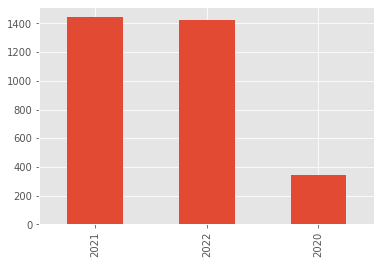

In [15]:
Avger['text'] = Avger['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")
Avger['year'].value_counts().plot(kind='bar')

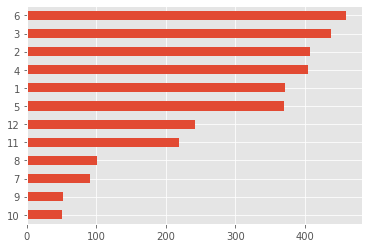

In [16]:
Avger['month'].value_counts().sort_values(ascending=True).plot(kind='barh')


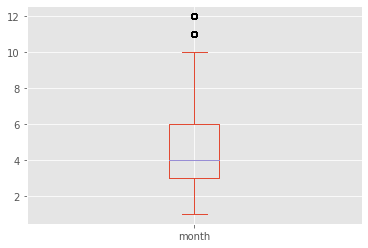

In [17]:
Avger['month'].plot(kind='box')

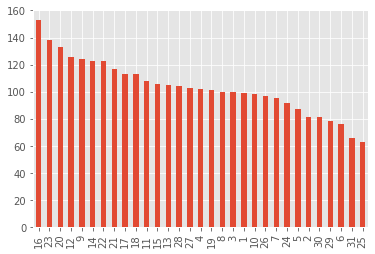

In [18]:
Avger['day'].value_counts().plot(kind='bar')

In [19]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [20]:
Avger[Avger['year']==2022]['text']

0       @JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...
1       @JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...
2       Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...
3       @PagourasPas Λέγονται και στρατηγοί του καναπέ...
4       @mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...
                              ...                        
1415    RT @XrPanag: Εξαιρετικά δυσάρεστη απόφαση για ...
1416    @RT_com's account has been withheld in Belgium...
1417    RT @OpenNewsGr: Έσχατο όπλο οι κυρώσεις, θα ση...
1418    RT @OpenNewsGr: Η ανταπόκριση του Θανάση Αυγερ...
1419    RT @Kosmodromio_gr: 2022, μπες με… ένα τραγούδ...
Name: text, Length: 1420, dtype: object

In [21]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
text = Avger['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')

In [22]:
text = Avger[Avger['year']==2020]['text'].str.cat(sep = '.').replace("amp", ' ')
text

'RT @XrPanag: Το τελευταίο δελτίο του χρόνου από το @OpenNewsGr. Στις 18.50 με τον @ipapadopoulos. @MARIAZAHARAKI @AvgerinosMoscow @mignatio….RT @mazzenilsson: What does it look like when you “liberate” a country that hasn’t asked for it, when you unleash a violent chain of events….RT @EmbassyofRussia: #OTD in 1922, the Union of Soviet Socialist Republics (USSR), one of the largest states ever existed, was established.….RT @st_stavropoulos: Τώρα που μπαίνουμε στα 200 χρόνια από το 1821,οι αντικληρικανοι (του ευγενούς κλάδου των ευρωλιγουρηδων), ας προσπαθήσ….RT @GeorgeTetradis: Οι ηλίθιοι φασίστες που επιτίθενται στίς "Πλειάδες"επειδή ψώνισε ο Μητσοτάκης από κει, δεν ξερουν ότι το βιβλιοπωλείο ε….RT @st_stavropoulos: "Αριστεροί" που επιτίθενται σε βιβλιοπωλείο, ως άλλοι ναζηδες, επειδή από αυτό ψώνισε βιβλία ο Μητσοτάκης, είναι αχθος….RT @XrPanag: Ο @AvgerinosMoscow στο δελτίο του @OpenNewsGr. @MARIAZAHARAKI @alexiatasouli.RT @OpenNewsGr: Η Μόσχα ρίχνει γέφυρες στο καθεστώς Σάρατζ – Ού

In [23]:
list(STOPWORDS)[0:20]

['else',
 "he's",
 'yours',
 'hers',
 "she's",
 'than',
 'these',
 "aren't",
 'myself',
 'was',
 "they've",
 'k',
 'would',
 "she'll",
 "shan't",
 'out',
 'on',
 "shouldn't",
 'their',
 "isn't"]

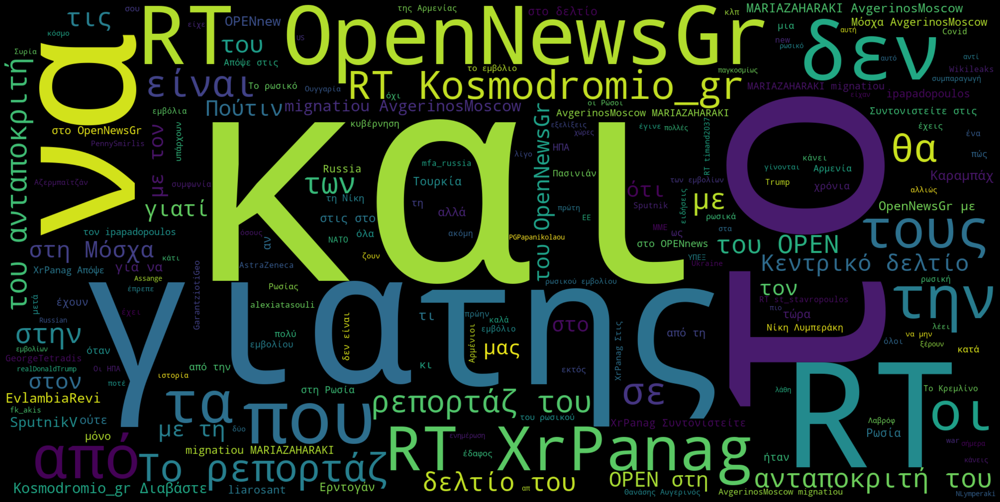

In [24]:
wordcloud = WordCloud(
#   stopwords = STOPWORDS,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [25]:
import spacy
!python -m spacy download el_core_news_sm


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 1.6 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [26]:
nlp = spacy.load('el_core_news_sm')
list(nlp.Defaults.stop_words)[0:20]

['οποιωνδήποτε',
 'συχνώς',
 'τέτοιας',
 'τες',
 'πάντα',
 'μεθαύριο',
 'μακρυά',
 'ναι',
 'προχτές',
 'όποιοι',
 'εντελώς',
 'έγιναν',
 'καλά',
 'έχομε',
 'πόση',
 'εξίσου',
 'δηλαδή',
 'τόσοι',
 'οσοδήποτε',
 'τόσου']

In [27]:
text = Avger['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'@JOHNRIZON22 Το έχω δει, αλλά γι\' αυτούς που μας διαβάζουν@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα, που εξατμίζεται ο φανατισμός και η ορμητική #ΝΑΤΟ-ϊκή προπαγάνδα, γίνονται κάποια πράγματα πιο καθαρά για τους πολλούς, που δεν είχαν σαφή εικόνα και πληροφορίες #UkrainewarΗ εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης ΛΔ του #Lugansk για το τι συμβαίνει στην πόλη που έχουν εγκαταλείψει οι δυνάμεις του #Kiev βομβαρδιζόταν ως το τέλος (την πτώση &; του #Lisitchansk χθες) για να μείνει "καμμένη γη" &; ακόμη πιο εξαθλιωμένοι κάτοικοι στη ρωσική πλευρά  @PagourasPas Λέγονται και στρατηγοί του καναπέως αυτοί που ξέρουν και διατάζουν τα πολλά και αποφασιστικά, που θέλουν κλιμάκωση, κήρυξη γενικευμένου πολέμου κοκ@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νεκροί είναι Ουκρανοί, ο 1 Ρώσος, επομένως λένε οι ντόπιοι οι ουκρανικοί πύραυλοι σκοτώνουν Ουκρανούς ακόμη και στο ρωσικό έδαφος@kentrodexia @AKaramitrou Ωραία πιπίλα μοίρασαν για να τρομάξουν την κοινή γνώμη στην Ελλάδα, μπας &; αντι

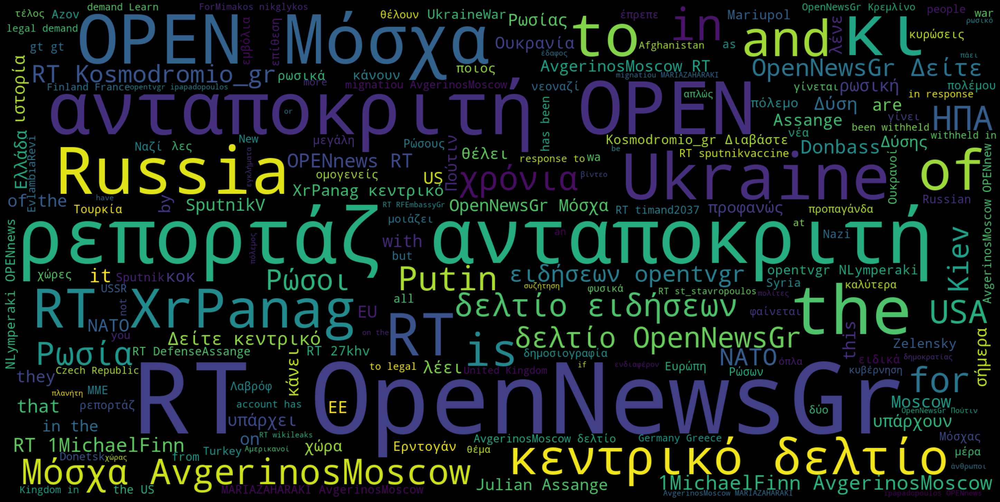

In [28]:

wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [29]:
from PIL import Image
import numpy as np

In [30]:
doc = nlp(Avger['text'][1])

In [31]:
for token in doc:
    print(token, token.lemma_)

@JOHNRIZON22 @JOHNRIZON22
Υπάρχει Υπάρχω
κάπου κάπου
υποτιτλισμένο υποτιτλισμένο
; ;
Τώρα τώρα
, ,
που που
εξατμίζεται εξατμίζεται
ο ο
φανατισμός φανατισμός
και και
η ο
ορμητική ορμητικός
# #
ΝΑΤΟ-ϊκή ΝΑΤΟ-ϊκός
προπαγάνδα προπαγάνδα
, ,
γίνονται γίνομαι
κάποια κάποιος
πράγματα πράγμα
πιο πιο
καθαρά καθαρά
για για
τους ο
πολλούς πολύς
, ,
που που
δεν δεν
είχαν έχω
σαφή σαφής
εικόνα εικόνα
και και
πληροφορίες πληροφορία
... ...
# #
Ukrainewar Ukrainewar


In [32]:
' '.join(token.lemma_ for token in doc)

'@JOHNRIZON22 Υπάρχω κάπου υποτιτλισμένο ; τώρα , που εξατμίζεται ο φανατισμός και ο ορμητικός # ΝΑΤΟ-ϊκός προπαγάνδα , γίνομαι κάποιος πράγμα πιο καθαρά για ο πολύς , που δεν έχω σαφής εικόνα και πληροφορία ... # Ukrainewar'

In [33]:
text

'@JOHNRIZON22 Το έχω δει, αλλά γι\' αυτούς που μας διαβάζουν@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα, που εξατμίζεται ο φανατισμός και η ορμητική #ΝΑΤΟ-ϊκή προπαγάνδα, γίνονται κάποια πράγματα πιο καθαρά για τους πολλούς, που δεν είχαν σαφή εικόνα και πληροφορίες #UkrainewarΗ εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης ΛΔ του #Lugansk για το τι συμβαίνει στην πόλη που έχουν εγκαταλείψει οι δυνάμεις του #Kiev βομβαρδιζόταν ως το τέλος (την πτώση &; του #Lisitchansk χθες) για να μείνει "καμμένη γη" &; ακόμη πιο εξαθλιωμένοι κάτοικοι στη ρωσική πλευρά  @PagourasPas Λέγονται και στρατηγοί του καναπέως αυτοί που ξέρουν και διατάζουν τα πολλά και αποφασιστικά, που θέλουν κλιμάκωση, κήρυξη γενικευμένου πολέμου κοκ@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νεκροί είναι Ουκρανοί, ο 1 Ρώσος, επομένως λένε οι ντόπιοι οι ουκρανικοί πύραυλοι σκοτώνουν Ουκρανούς ακόμη και στο ρωσικό έδαφος@kentrodexia @AKaramitrou Ωραία πιπίλα μοίρασαν για να τρομάξουν την κοινή γνώμη στην Ελλάδα, μπας &; αντι

In [34]:
full_doc = nlp(text)

In [35]:
clear_text = ' '.join(token.lemma_ for token in full_doc)

In [36]:
clear_text[200:400]

'ιο καθαρά για ο πολύς , που δεν έχω σαφής εικόνα και πληροφορία # UkrainewarΗ εκδοχή ο ρωσόφωνας ο αυτοαποκαλούμενης ΛΔ ο # Lugansk για ο τι συμβαίνω σε ο πόλη που έχω εγκαταλείπω ο δύναμη ο # Kiev βο'

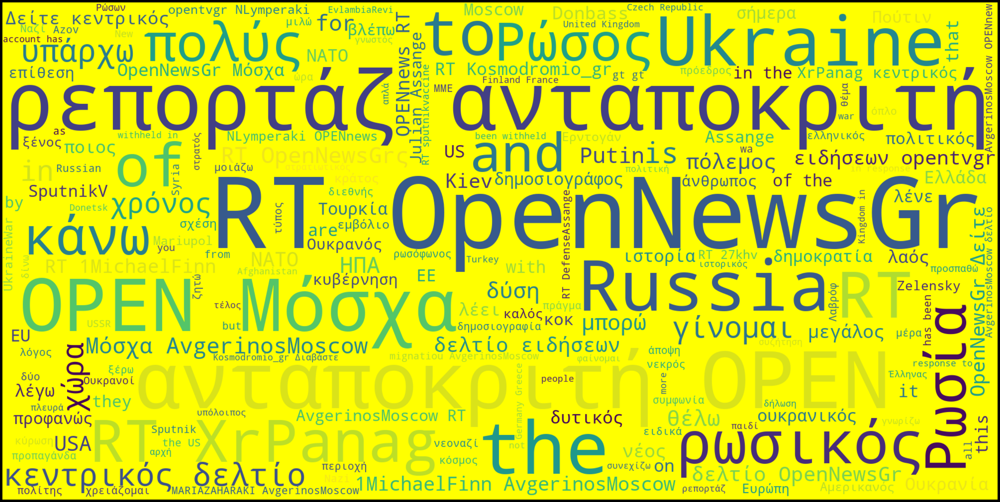

In [37]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'yellow'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [38]:
from collections import Counter
Counter(" ".join(Avger["text"]).split()).most_common(16)

[('RT', 1793),
 ('του', 1711),
 ('και', 1322),
 ('να', 1154),
 ('το', 1073),
 ('για', 894),
 ('της', 789),
 ('η', 757),
 ('που', 754),
 ('με', 727),
 ('από', 672),
 ('@OpenNewsGr:', 660),
 ('την', 623),
 ('Το', 595),
 ('&amp;', 575),
 ('στη', 573)]

In [39]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

οποιωνδήποτε


In [40]:
Avger['text_no_stopwords'] = Avger['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Avger['text_no_stopwords'] = Avger['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Avger['clean_text_no_stopwords'] = Avger['text']
#for stopword in nlp.Defaults.stop_words:
Avger['clean_text_no_stopwords'] = Avger['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Avger['clean_text_no_stopwords'] = Avger['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Avger['clean_text_no_stopwords'] = Avger['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Avger['clean_text_no_stopwords'] = Avger['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Avger['clean_text_no_stopwords'] = Avger['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Avger['clean_text_no_stopwords'] = Avger['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Avger['clean_text_no_stopwords'] = Avger['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [41]:
freq = Counter(" ".join(Avger["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('RT', 1793),
 ('@OpenNewsGr', 821),
 ('Το', 595),
 ('&;', 575),
 ('|', 465),
 ('the', 427),
 ('ρεπορτάζ', 413),
 ('Μόσχα', 393),
 ('@AvgerinosMoscow', 322),
 ('ανταποκριτή', 319),
 ('OPEN', 304),
 ('Η', 271),
 ('-', 264),
 ('in', 255),
 ('to', 250),
 ('of', 246)]

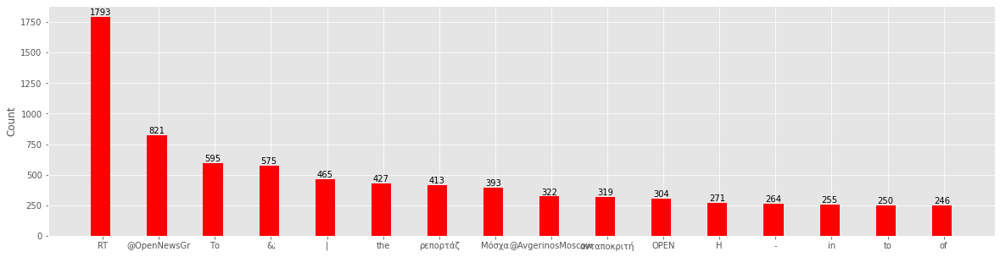

In [42]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

# Vectorizing Avgerdf



In [43]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [44]:
count_vector = cv.fit_transform(Avger['text'])

In [45]:
count_vector.shape

(3205, 15986)

In [46]:
cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,01,03,04,06,07,10,100,1000,...,художественной,художника,шестакова,эрдоган,юрия,являются,ἀγώνας,ἀλεξὰντρ,ἐλευθερία,ἐραστὴς
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
#cv.vocabulary_

In [48]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [49]:
count_vector = cv.fit_transform(Avger['text'])

In [50]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,18,1michaelfinn,2014,27khv,50,alexiatasouli,amp,and,are,as,...,ρωσικό,ρώσοι,ρώσους,σήμερα,τουρκία,υπάρχει,υπάρχουν,χρόνια,χώρα,χώρες
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [51]:
from html import unescape
def my_tokenizer(doc):
            
    # apply the preprocessing and tokenzation steps
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    # use CountVectorizer's _word_ngrams built in method
    # to remove stop words and extract n-grams
    return(lemmatized_tokens)

In [52]:
 cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
 count_vector = cv.fit_transform(Avger['text'])
 results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
 results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['έκασε ο', 'έτερα', 'έτερων', 'ήσω', 'ίσιος', 'αλλιώ', 'αλλιώτικος', 'αλλοιώ', 'αρκετός', 'γίνομαι', 'γρήγορο', 'διο', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'επόμενος', 'εσένος', 'ετέραις', 'ετού', 'ετούε ο', 'εχτής', 'ιδίο', 'κάνενς', 'κάνω', 'κανενό', 'λοιπός', 'μέλλω', 'μερικός', 'μπορώ', 'μόνας', 'ολωσδιόλος', 'ορισμένος', 'οριόμενσς', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'ταύ', 'τουλάχισε ο', 'τρίτος', 'τός', 'χωριστό'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,...,18.50,18:50,2014,@1michaelfinn,@27khv,@alexiatasouli,@avgerinosmoscow,@defenseassange,@ipapadopoulos,...,σήμερα,σε ο,στρατός,συμφωνία,σχέση,τουρκία,τύπος,υπάρχω,χρόνος,χώρα
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [53]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Avger['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,50,amp,avgerinosmoscow,in,is,of,open,opennews,opennewsgr,rt,russia,the,to,ukraine,xrpanag,ανταποκριτή,δελτίο,κι,μόσχα,ρεπορτάζ
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [54]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\ουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Avger['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκασένκο,ουκιά,ουκρ,ουκρανία,ουκρανίας,ουκρανικά,ουκρανικές,ουκρανική,ουκρανικής,ουκρανικού,ουκρανικούς,ουκρανικό,ουκρανικός,ουκρανικών,ουκρανοί,ουκρανοποίηση,ουκρανού,ουκρανούς,ουκρανός,ουκρανών
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


In [55]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, ngram_range=(2, 2) ) #token_pattern = '\\bουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Avger['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,18 50,1michaelfinn avgerinosmoscow,julian assange,of the,open μόσχα,opennewsgr δείτε,opennewsgr μόσχα,opentvgr 18,rt 1michaelfinn,rt kosmodromio_gr,rt opennewsgr,rt xrpanag,ανταποκριτή open,δείτε κεντρικό,δελτίο opennewsgr,δελτίο ειδήσεων,ειδήσεων opentvgr,κεντρικό δελτίο,μόσχα avgerinosmoscow,ρεπορτάζ ανταποκριτή
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [56]:
results.sum(axis =0).sort_values(ascending = False)

rt opennewsgr                   660
ρεπορτάζ ανταποκριτή            325
ανταποκριτή open                303
open μόσχα                      258
rt xrpanag                      170
κεντρικό δελτίο                 131
18 50                           127
μόσχα avgerinosmoscow           105
δελτίο opennewsgr                97
rt kosmodromio_gr                86
δελτίο ειδήσεων                  83
rt 1michaelfinn                  79
opennewsgr δείτε                 78
ειδήσεων opentvgr                76
1michaelfinn avgerinosmoscow     75
opentvgr 18                      65
δείτε κεντρικό                   65
opennewsgr μόσχα                 58
of the                           49
julian assange                   43
dtype: int64

In [57]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head() 

rt opennewsgr           660
ρεπορτάζ ανταποκριτή    325
ανταποκριτή open        303
open μόσχα              258
rt xrpanag              170
dtype: int64

In [58]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bουκ[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bκυβ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\bcov[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Avger['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,cover,coverage,covered,covering,covid,covid-19,covid1,covid19,covid_19
0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0


In [59]:
results.sum(axis =0).sort_values(ascending = False)

covid19     11
covid        7
covid-19     7
covered      3
cover        2
covering     2
covid_19     2
coverage     1
covid1       1
dtype: int64

In [60]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['ουκρανια', 'πολεμος', 'ρωσια']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Avger['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκρανια,πολεμος,ρωσια
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0


In [61]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [62]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(Avger['text'])  #finds the tfidf score with normalization

In [63]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,10,13,18,19,1michaelfinn,20,2014,27khv,...,χρειάζονται,χρόνια,χρόνο,χώρα,χώρας,χώρες,όνομα,όπλα,ώρα,ώρες
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [64]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

cosine scores ==>  [[0. 0. 0. ... 0. 0. 0.]]


In [65]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements

cosine scores ==>  [[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         1.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 1.         0.55130814 0.        ]
 [0.         0.         0.         ... 0.55130814 1.         0.        ]
 [0.         0.         0.         ... 0.         0.         1.        ]]


In [66]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

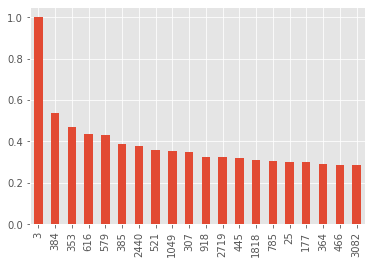

In [67]:
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [68]:
Avger['text'].loc[3]

'@PagourasPas Λέγονται και στρατηγοί του καναπέως αυτοί που ξέρουν και διατάζουν τα πολλά και αποφασιστικά, που θέλουν κλιμάκωση, κήρυξη γενικευμένου πολέμου κ.ο.κ.'

In [69]:
Avger['text'].loc[2823]

'@CorinaVasilopou Μενδώνη, Χρυσοχοΐδη, γιατί τους ξέχασες;'

# Emolex Avgerdf

In [70]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [72]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)

In [73]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [74]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [75]:
Avger_tweets_df = pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/Avger.tsv", sep='\t')

In [76]:
len(Avger_tweets_df)

3205

In [77]:
short_tweets_Avger = Avger_tweets_df[['created_at','full_text' ]]
short_tweets_Avger = short_tweets_Avger.rename(columns={'created_at': 'date', 'full_text': 'text'} )

In [78]:
short_tweets_Avger.tail()

,date,text
3200,Tue Nov 10 11:15:19 +0000 2020,"RT @machiavelli_gr: Για την ιστορία, να θυμίσο..."
3201,Tue Nov 10 10:15:07 +0000 2020,RT @OpenNewsGr: Έξαλλο πλήθος εισέβαλε στο κοι...
3202,Mon Nov 09 19:08:51 +0000 2020,RT @OpenNewsGr: Σφίγγει ο κλοιός των Αζέρων στ...
3203,Mon Nov 09 16:01:30 +0000 2020,RT @OpenNewsGr: Το Κρεμλίνο περιμένει και επίσ...
3204,Mon Nov 09 13:39:49 +0000 2020,Ο Έβο Μοράλες επιστρέφει στη Βολιβία μετά το π...


In [79]:
short_tweets_Avger.dtypes

date    object
text    object
dtype: object

In [80]:
short_tweets_Avger['date'] = pd.to_datetime(short_tweets_Avger['date'], format='%a %b %d %H:%M:%S +0000 %Y')

In [81]:
short_tweets_Avger['year'] = pd.DatetimeIndex(short_tweets_Avger['date']).year
short_tweets_Avger['month'] = pd.DatetimeIndex(short_tweets_Avger['date']).month
short_tweets_Avger['day'] = pd.DatetimeIndex(short_tweets_Avger['date']).day
short_tweets_Avger

,date,text,year,month,day
0,2022-07-03 13:54:35,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...",2022,7,3
1,2022-07-03 13:31:38,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...,2022,7,3
2,2022-07-03 13:10:51,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...,2022,7,3
3,2022-07-03 11:30:30,@PagourasPas Λέγονται και στρατηγοί του καναπέ...,2022,7,3
4,2022-07-03 11:28:16,@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...,2022,7,3
...,...,...,...,...,...
3200,2020-11-10 11:15:19,"RT @machiavelli_gr: Για την ιστορία, να θυμίσο...",2020,11,10
3201,2020-11-10 10:15:07,RT @OpenNewsGr: Έξαλλο πλήθος εισέβαλε στο κοι...,2020,11,10
3202,2020-11-09 19:08:51,RT @OpenNewsGr: Σφίγγει ο κλοιός των Αζέρων στ...,2020,11,9
3203,2020-11-09 16:01:30,RT @OpenNewsGr: Το Κρεμλίνο περιμένει και επίσ...,2020,11,9


In [82]:
short_tweets_Avger.dtypes

date     datetime64[ns]
text             object
year              int64
month             int64
day               int64
dtype: object

In [83]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [84]:
short_tweets_Avger['text'] = short_tweets_Avger['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [85]:
short_tweets_Avger.head()

,date,text,year,month,day
0,2022-07-03 13:54:35,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...",2022,7,3
1,2022-07-03 13:31:38,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...,2022,7,3
2,2022-07-03 13:10:51,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...,2022,7,3
3,2022-07-03 11:30:30,@PagourasPas Λέγονται και στρατηγοί του καναπέ...,2022,7,3
4,2022-07-03 11:28:16,@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...,2022,7,3


In [86]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [87]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(short_tweets_Avger['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [88]:
wordcount_df.shape

(3205, 13161)

In [89]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [90]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [91]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']


In [92]:
short_tweets_Avger.head(3)

,date,text,year,month,day
0,2022-07-03 13:54:35,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...",2022,7,3
1,2022-07-03 13:31:38,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...,2022,7,3
2,2022-07-03 13:10:51,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...,2022,7,3


In [93]:
short_tweets_Avger['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_Avger['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_Avger['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_Avger['disgust'] = wordcount_df[disgust_words].sum(axis=1)



short_tweets_Avger['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_Avger['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_Avger['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_Avger['sadness'] = wordcount_df[sadness_words].sum(axis=1)

short_tweets_Avger['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_Avger['fear'] = wordcount_df[fear_words].sum(axis=1)


In [94]:
short_tweets_Avger

,date,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2022-07-03 13:54:35,"@JOHNRIZON22 Το έχω δει, αλλά γι' αυτούς που μ...",2022,7,3,0,0,0,0,0,0,0,0,0,0
1,2022-07-03 13:31:38,@JOHNRIZON22 Υπάρχει κάπου υποτιτλισμένο; Τώρα...,2022,7,3,0,3,1,0,1,1,0,0,2,1
2,2022-07-03 13:10:51,Η εκδοχή των ρωσόφωνων της αυτοαποκαλούμενης Λ...,2022,7,3,1,1,0,1,0,0,0,1,2,0
3,2022-07-03 11:30:30,@PagourasPas Λέγονται και στρατηγοί του καναπέ...,2022,7,3,0,2,1,1,1,1,1,0,1,1
4,2022-07-03 11:28:16,@mpyridou Η τραγική ειρωνεία είναι ότι οι 3 νε...,2022,7,3,0,0,0,1,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200,2020-11-10 11:15:19,"RT @machiavelli_gr: Για την ιστορία, να θυμίσο...",2020,11,10,0,1,0,0,0,0,0,0,0,0
3201,2020-11-10 10:15:07,RT @OpenNewsGr: Έξαλλο πλήθος εισέβαλε στο κοι...,2020,11,10,0,0,0,0,0,1,0,0,0,0
3202,2020-11-09 19:08:51,RT @OpenNewsGr: Σφίγγει ο κλοιός των Αζέρων στ...,2020,11,9,1,0,0,0,0,0,0,0,1,0
3203,2020-11-09 16:01:30,RT @OpenNewsGr: Το Κρεμλίνο περιμένει και επίσ...,2020,11,9,0,0,0,0,0,0,0,0,0,0


In [95]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_Avger)):
  #print(short_tweets_Avger.iloc[i]['positivity'])
  if short_tweets_Avger.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_Avger.iloc[i]['text']
    max = short_tweets_Avger.iloc[i]['positivity']


happiest_tweet

'@alexkara1989 Αν θέλετε να κάνετε αυθαίρετες ερμηνείες σε τι αρέσκομαι ή προσπαθώ, μπορώ να αυθαιρετίσω κι εγώ. Προς το παρόν συζητάω, οπότε διευκρινίστε μας: 1) Η Επανάσταση του 1821 κι η Μικρασιατική Εκστρατεία ήταν αναθεωρητισμοί; 2) Υπάρχει καλός και κακός αναθεωρητισμός ή ιμπεριαλισμός;'

In [96]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_Avger)):
  #print(short_tweets_Avger.iloc[i]['positivity'])
  if short_tweets_Avger.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_Avger.iloc[i]['text']
    max = short_tweets_Avger.iloc[i]['negative']


negative_tweet

'@greekphase @kostarvanitis Κάθε θάνατος προκαλεί θλίψη, η οποία δεν μπορεί, όμως να είναι επιλεκτική. Μέχρι σήμερα από το 2014 και τη βίαια ανατροπή του Γιανουκόβιτς στην #Ukraine έχουν δυστυχώς σκοτωθεί κατά τον ΟΑΣΕ 13-14.000 άνθρωποι στην εμφύλια σύρραξη...'

In [97]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_Avger)):
  #print(short_tweets_Avger.iloc[i]['positivity'])
  if short_tweets_Avger.iloc[i]['sadness'] > max:
    saddest_tweet = short_tweets_Avger.iloc[i]['text']
    max = short_tweets_Avger.iloc[i]['sadness']

saddest_tweet

'Τι να κάνει κι ο εξόριστος Ουκρανός συνάδελφος, που εκδιώχθηκε από το #Kiev, χασκογελάει με το επίπεδο της δημοσιογραφίας μας: "Ο άρρωστος με καρκίνο, που μόλις συνήλθε από κώμα #Putin ήδη μιλάει 3 ώρες χωρίς διακοπή στο Φόρουμ Αγίας Πετρούπολης. Θαύματα της ρωσικής ιατρικής!"...  '

In [98]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_Avger)):
  #print(short_tweets_Avger.iloc[i]['positivity'])
  if short_tweets_Avger.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_Avger.iloc[i]['text']
    max = short_tweets_Avger.iloc[i]['fear']

fear_tweet

'5 νεκροί, 20 τραυματίες από τυφλό χτύπημα με πολλαπλό εκτοξευτήρα από το πυροβολικό της #Ukraine κοντά στην παρόχθια οδό του ποταμού  #Kalmius στο #Donetsk. Ουδεμία "στρατιωτική" λογική στο χτύπημα, μόνο εκδίκηση και μόνο άμαχοι εκεί, τα μέτωπα είναι αλλού  '

In [99]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_Avger)):
  #print(short_tweets_Avger.iloc[i]['positivity'])
  if short_tweets_Avger.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_Avger.iloc[i]['text']
    max = short_tweets_Avger.iloc[i]['trust']

trust_tweet

"@kentrodexia Στείλε πρώτα τις εκθέσεις για τον 8ετη βομβαρδισμό πόλεων του #Donbass από το πυροβολικό της #Ukraine. Και τώρα ακόμη σκάνε βόμβες στο κέντρο του #Donetsk, ήμουν και μάρτυρας. Αφού είναι αντικειμενικοί οργανισμοί, δεν μπορεί, θα έχουν κι εκθέσεις γι' αυτό, που ξεκίνησε νωρίτερα"

In [100]:
short_tweets_Avger.set_index('date' , inplace=True)

In [101]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

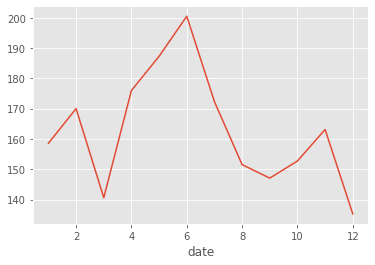

In [102]:
short_tweets_Avger['text'].str.len().groupby(by=short_tweets_Avger.index.month).mean().plot()

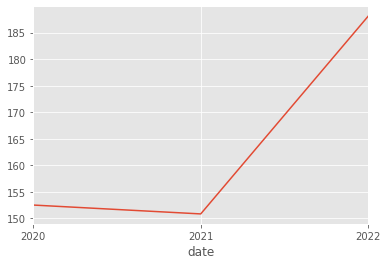

In [103]:
short_tweets_Avger['text'].str.len().resample('A').mean().plot() 

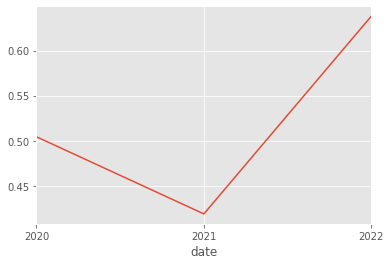

In [104]:
short_tweets_Avger['positivity'].resample('A').mean().plot() 

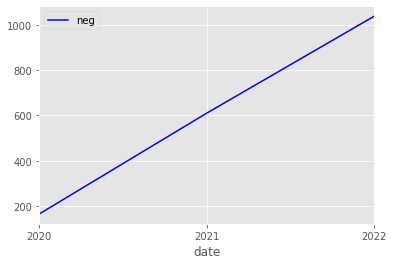

In [105]:
short_tweets_Avger['negative'].resample('A').sum().plot(color = 'b',label = 'neg').legend() 

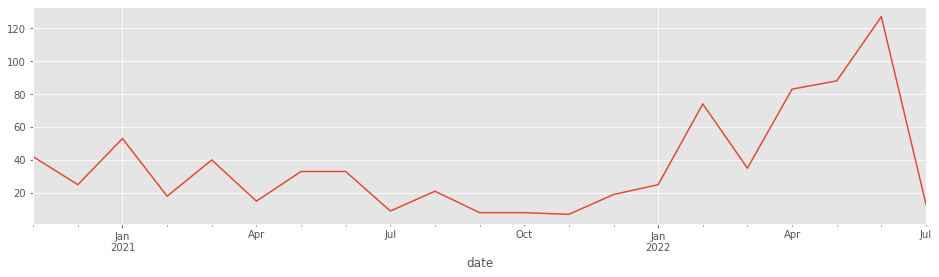

In [106]:
short_tweets_Avger['anger'].resample('M').sum().plot(figsize=(16,4))

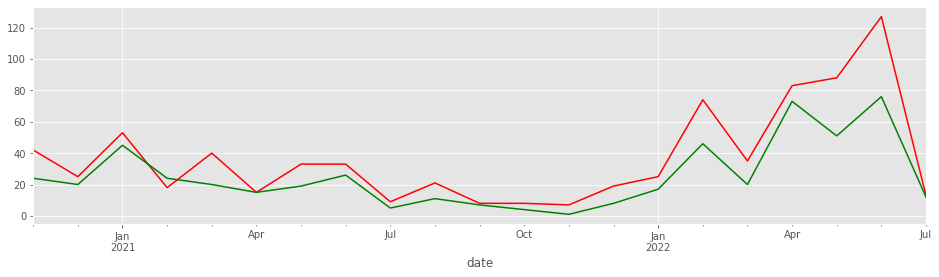

In [107]:
ax = short_tweets_Avger['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Avger['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

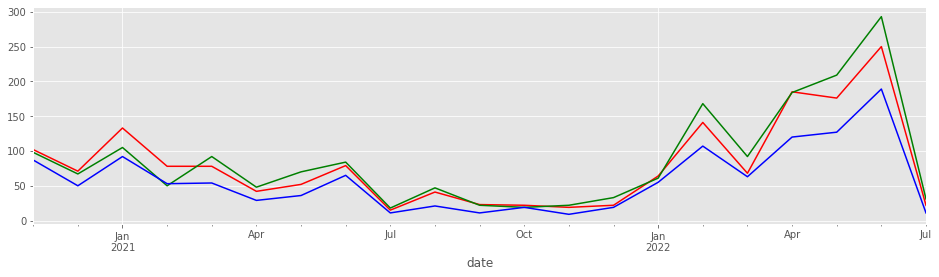

In [108]:
ax = short_tweets_Avger['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Avger['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Avger['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

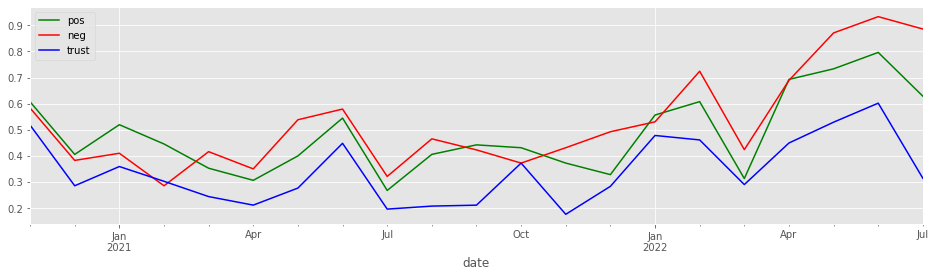

In [109]:
ax = short_tweets_Avger['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Avger['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Avger['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

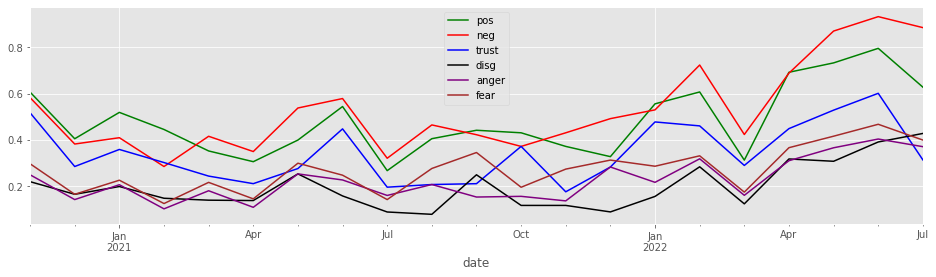

In [110]:
plt.style.use('ggplot')
ax = short_tweets_Avger['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Avger['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Avger['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

short_tweets_Avger['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

short_tweets_Avger['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

short_tweets_Avger['fear'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

Text(0, 0.5, 'Years')

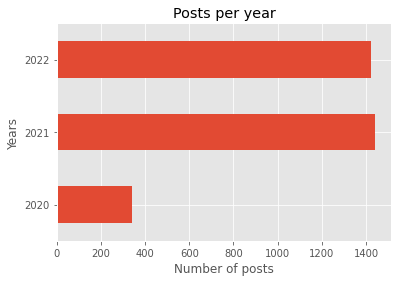

In [111]:
short_tweets_Avger['text'].groupby(by=short_tweets_Avger.index.year).count().plot(kind='barh')
plt.title("Posts per year")
plt.xlabel("Number of posts")
plt.ylabel("Years")

Text(0, 0.5, 'Month of the year')

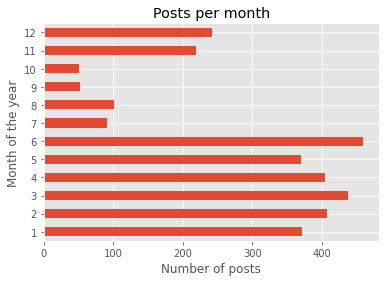

In [112]:
short_tweets_Avger['text'].groupby(by=short_tweets_Avger.index.month).count().plot(kind='barh')
plt.title("Posts per month")
plt.xlabel("Number of posts")
plt.ylabel("Month of the year")

Text(0, 0.5, 'Hour of the day')

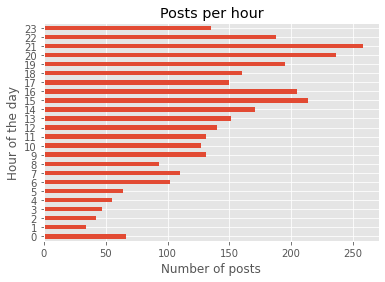

In [113]:
short_tweets_Avger['text'].groupby(by=short_tweets_Avger.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

# ONisenko
# https://twitter.com/Onisenko

In [115]:
Oni = []
try:
    user_timeline = twitter.get_user_timeline(screen_name='Onisenko',count=200, tweet_mode = 'extended'  )
except TwythonError as e:
    print("Error getting tweets:", e)
print("I Got:", len(user_timeline), " tweets")
for tweet in user_timeline:
    # Add whatever you want from the tweet, here we just add the text
    Oni.append(tweet)

I Got: 199  tweets


In [116]:
pd.DataFrame(Oni)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,favorite_count,favorited,retweeted,lang,possibly_sensitive,extended_entities,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
0,Sun Jul 03 07:24:33 +0000 2022,1543495898004656128,1543495898004656128,RT @pravda_eng: Mother kisses her daughter for...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
1,Sat Jul 02 21:32:11 +0000 2022,1543346825171714048,1543346825171714048,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...,False,"[0, 145]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,332,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN
2,Sat Jul 02 21:21:17 +0000 2022,1543344079324565504,1543344079324565504,@InfoWarriorNews άντε ρε πουλημένο τομάρι,False,"[17, 41]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",1.543292e+18,1543292011507290112,...,3,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN
3,Sat Jul 02 19:18:38 +0000 2022,1543313213340536832,1543313213340536832,129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ h...,False,"[0, 68]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://periscope.tv"" rel=""nofollow"">...",NaN,None,...,57,False,False,el,False,NaN,NaN,NaN,NaN,NaN
4,Sat Jul 02 18:08:40 +0000 2022,1543295605463830533,1543295605463830533,RT @Gerashchenko_en: I keep thinking about thi...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,Mon May 02 15:18:49 +0000 2022,1521147203837865984,1521147203837865984,68η μέρα πολιορκίας https://t.co/JZmq3my63d,False,"[0, 43]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://periscope.tv"" rel=""nofollow"">...",NaN,None,...,100,False,False,el,False,NaN,NaN,NaN,NaN,NaN
195,Mon May 02 09:29:26 +0000 2022,1521059279633096705,1521059279633096705,RT @yairlapid: Foreign Minister Lavrov’s remar...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
196,Mon May 02 07:04:26 +0000 2022,1521022787326033922,1521022787326033922,RT @DemeryUK: Russians bringing in more artill...,False,"[0, 111]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,en,False,"{'media': [{'id': 1520778631152381955, 'id_str...",NaN,NaN,NaN,NaN
197,Mon May 02 06:10:05 +0000 2022,1521009112057843712,1521009112057843712,RT @jeansouliotis: Ζελένσκι στην ΕΡΤ: «Ο πόλεμ...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,0,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN


In [117]:
# Count could be less than 200, see:
# https://dev.twitter.com/discussions/7513
while len(user_timeline) != 0: 
    try:
        user_timeline = twitter.get_user_timeline(screen_name='Onisenko',count=100,
                                                  tweet_mode = 'extended', max_id=user_timeline[len(user_timeline)-1]['id']-1)
    except TwythonError as e:
        print("Error getting tweets:", e)
    if len(user_timeline) > 0:
        print("I Got:", len(user_timeline), " tweets more... Last ID:", user_timeline[len(user_timeline)-1]['id']-1)
    for tweet in user_timeline:
        # Add whatever you want from the tweet, here we just add the text
        Oni.append(tweet)
# Number of tweets the user has made
print("I got :", len(Oni), " in total!!!")

I Got: 98  tweets more... Last ID: 1517574129376972800
I Got: 99  tweets more... Last ID: 1513355667012161540
I Got: 99  tweets more... Last ID: 1504377517238538242
I Got: 99  tweets more... Last ID: 1500739259560517631
I Got: 98  tweets more... Last ID: 1497148274138136578
I Got: 100  tweets more... Last ID: 1491685879286480897
I Got: 100  tweets more... Last ID: 1484930960407908356
I Got: 98  tweets more... Last ID: 1477913778977230848
I Got: 100  tweets more... Last ID: 1396841190608232453
I Got: 37  tweets more... Last ID: 438017211626946559
I got : 1127  in total!!!


In [118]:
# Number of tweets the user has made
print("I got :", len(Oni), " in total!!!")
#len(Oni)

I got : 1127  in total!!!


In [119]:
for tweet in Oni:
    print(tweet['created_at'],tweet['full_text'])

Sun Jul 03 07:24:33 +0000 2022 RT @pravda_eng: Mother kisses her daughter for the last time at her funeral. She died during the shelling in the village Bezruky, Kharkiv o…
Sat Jul 02 21:32:11 +0000 2022 Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-τρολ ακάου ξεπερνάει την ταχύτητα με την οποία κάνω πλοκ. Είναι μια άνιση μάχη αλλά δεν τα παρατάω.
Sat Jul 02 21:21:17 +0000 2022 @InfoWarriorNews άντε ρε πουλημένο τομάρι
Sat Jul 02 19:18:38 +0000 2022 129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ https://t.co/p8vaj3ICLc
Sat Jul 02 18:08:40 +0000 2022 RT @Gerashchenko_en: I keep thinking about this dog, red Fox. Russians beat him up, broke his paws, threw him in the dumpster and mined him…
Sat Jul 02 17:14:53 +0000 2022 Αγαπητά ρωSSo μποτ, πάρτε μάσα ζαχάροβα να γουστάρετε και καλό υπόλοιπο σκ. https://t.co/XzeaUw78DS
Sat Jul 02 16:35:53 +0000 2022 RT @DMokryk: Eva Smulska, 8 years old. Killed by a 🇷🇺Russian missile strike on the night of June 28th in 🇺🇦Ochakiv, Mykolaiv region. She wa…
Fri

In [120]:
#Oni[0]

In [121]:
Oni_df = pd.DataFrame(Oni)
Oni_df.head()

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,favorite_count,favorited,retweeted,lang,possibly_sensitive,extended_entities,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
0,Sun Jul 03 07:24:33 +0000 2022,1543495898004656128,1543495898004656128,RT @pravda_eng: Mother kisses her daughter for...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN
1,Sat Jul 02 21:32:11 +0000 2022,1543346825171714048,1543346825171714048,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...,False,"[0, 145]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,332,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN
2,Sat Jul 02 21:21:17 +0000 2022,1543344079324565504,1543344079324565504,@InfoWarriorNews άντε ρε πουλημένο τομάρι,False,"[17, 41]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",1.543292e+18,1543292011507290112,...,3,False,False,el,NaN,NaN,NaN,NaN,NaN,NaN
3,Sat Jul 02 19:18:38 +0000 2022,1543313213340536832,1543313213340536832,129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ h...,False,"[0, 68]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://periscope.tv"" rel=""nofollow"">...",NaN,None,...,57,False,False,el,False,NaN,NaN,NaN,NaN,NaN
4,Sat Jul 02 18:08:40 +0000 2022,1543295605463830533,1543295605463830533,RT @Gerashchenko_en: I keep thinking about thi...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,0,False,False,en,NaN,NaN,NaN,NaN,NaN,NaN


In [122]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [123]:
Oni_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/Oni.tsv", sep='\t')

# Επεξεργασία Onidf

In [124]:
Oni = Oni_df[['created_at','full_text' ]]
Oni = Oni.rename(columns={'created_at': 'date', 'full_text': 'text'} )
Oni

,date,text
0,Sun Jul 03 07:24:33 +0000 2022,RT @pravda_eng: Mother kisses her daughter for...
1,Sat Jul 02 21:32:11 +0000 2022,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...
2,Sat Jul 02 21:21:17 +0000 2022,@InfoWarriorNews άντε ρε πουλημένο τομάρι
3,Sat Jul 02 19:18:38 +0000 2022,129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ h...
4,Sat Jul 02 18:08:40 +0000 2022,RT @Gerashchenko_en: I keep thinking about thi...
...,...,...
1122,Wed Apr 01 14:20:11 +0000 2020,Έγραψα ένα βίντεο για τον ρόλο των μυστικών υπ...
1123,Fri Sep 06 18:44:05 +0000 2019,RT @KappaNewsGr: Βασικός ύποπτος στην υπόθεση ...
1124,Mon Apr 28 14:06:07 +0000 2014,@POPOVRTR Международная журналистика вас не за...
1125,Mon Apr 28 13:43:39 +0000 2014,Simon Ostrovsky tells the full story of his ab...


In [125]:
#Oni.dtypes

In [126]:
Oni['year'] = pd.DatetimeIndex(Oni['date']).year
Oni['month'] = pd.DatetimeIndex(Oni['date']).month
Oni['day'] = pd.DatetimeIndex(Oni['date']).day
Oni

,date,text,year,month,day
0,Sun Jul 03 07:24:33 +0000 2022,RT @pravda_eng: Mother kisses her daughter for...,2022,7,3
1,Sat Jul 02 21:32:11 +0000 2022,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...,2022,7,2
2,Sat Jul 02 21:21:17 +0000 2022,@InfoWarriorNews άντε ρε πουλημένο τομάρι,2022,7,2
3,Sat Jul 02 19:18:38 +0000 2022,129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ h...,2022,7,2
4,Sat Jul 02 18:08:40 +0000 2022,RT @Gerashchenko_en: I keep thinking about thi...,2022,7,2
...,...,...,...,...,...
1122,Wed Apr 01 14:20:11 +0000 2020,Έγραψα ένα βίντεο για τον ρόλο των μυστικών υπ...,2020,4,1
1123,Fri Sep 06 18:44:05 +0000 2019,RT @KappaNewsGr: Βασικός ύποπτος στην υπόθεση ...,2019,9,6
1124,Mon Apr 28 14:06:07 +0000 2014,@POPOVRTR Международная журналистика вас не за...,2014,4,28
1125,Mon Apr 28 13:43:39 +0000 2014,Simon Ostrovsky tells the full story of his ab...,2014,4,28


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


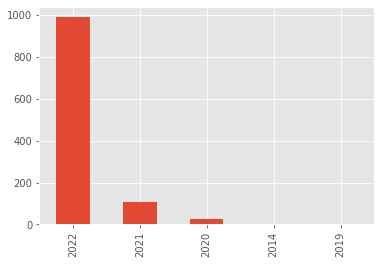

In [127]:
Oni['text'] = Oni['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")
Oni['year'].value_counts().plot(kind='bar')

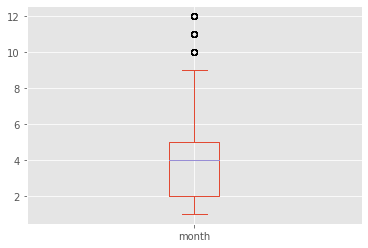

In [128]:
Oni['month'].plot(kind='box')

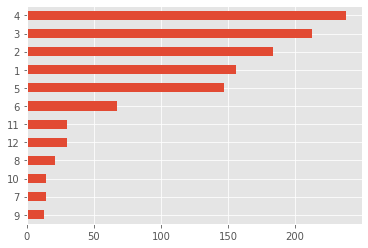

In [129]:
Oni['month'].value_counts().sort_values(ascending=True).plot(kind='barh')


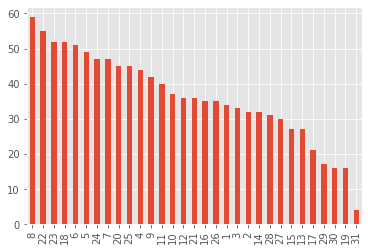

In [130]:
Oni['day'].value_counts().plot(kind='bar')

In [131]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [132]:
Oni[Oni['year']==2022]['text']

0      RT @pravda_eng: Mother kisses her daughter for...
1      Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...
2              @InfoWarriorNews άντε ρε πουλημένο τομάρι
3         129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ  
4      RT @Gerashchenko_en: I keep thinking about thi...
                             ...                        
985                 σύντομα στο παγκόσμιο βιβλιοπωλείο  
986    Το βραβείο ηλιθιότητας πάει στον νοτιοκορεάτη,...
987    Ένα από τα πολλά πράγματα που είχε απαγορεύσει...
988    @Jorge_Irraizoz Κάνει πολλά λάθη ο Ζε. Κυρίως ...
989    Μίλησαν χθες Μπάιντεν με τον Ζελένσκι τηλεφωνι...
Name: text, Length: 990, dtype: object

In [133]:
# Ισως καποτε χρειαστεί να αφαιρέσουμε τους τόνους.....
text = Oni['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')

In [134]:
text = Oni[Oni['year']==2022]['text'].str.cat(sep = '.').replace("amp", ' ')
text

'RT @pravda_eng: Mother kisses her daughter for the last time at her funeral. She died during the shelling in the village Bezruky, Kharkiv o….Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-τρολ ακάου ξεπερνάει την ταχύτητα με την οποία κάνω πλοκ. Είναι μια άνιση μάχη αλλά δεν τα παρατάω..@InfoWarriorNews άντε ρε πουλημένο τομάρι.129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ  .RT @Gerashchenko_en: I keep thinking about this dog, red Fox. Russians beat him up, broke his paws, threw him in the dumpster and mined him….Αγαπητά ρωSSo μποτ, πάρτε μάσα ζαχάροβα να γουστάρετε και καλό υπόλοιπο σκ.  .RT @DMokryk: Eva Smulska, 8 years old. Killed by a 🇷🇺Russian missile strike on the night of June 28th in 🇺🇦Ochakiv, Mykolaiv region. She wa….Έχετε ακούσει για τη νέα ZVαστικα;.128η μέρα εισβολής - Μάσα, πάει και το μπόρς  .Η μάσα η ζαχάροβα θα είναι έξαλλη με τη Γιουνέσκο!\n .Είναι εμφανές ότι οι νεο-ναζιστικές γραμμές των τρένων έχουν αποθρασυνθεί. Αλλά ο γενναίος τσετσένος του Καντίροφ τους έδωσε να

In [135]:
list(STOPWORDS)[0:20]

['else',
 "he's",
 'yours',
 'hers',
 "she's",
 'than',
 'these',
 "aren't",
 'myself',
 'was',
 "they've",
 'k',
 'would',
 "she'll",
 "shan't",
 'out',
 'on',
 "shouldn't",
 'their',
 "isn't"]

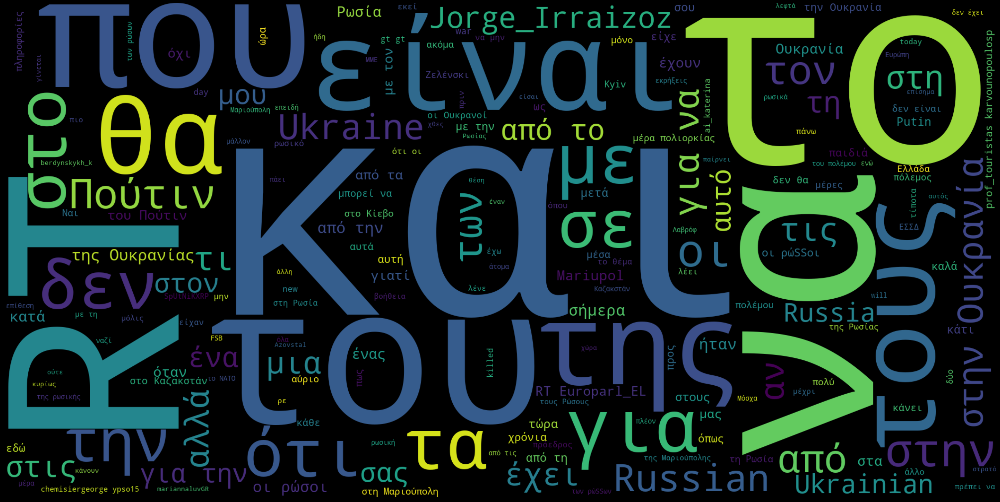

In [136]:
wordcloud = WordCloud(
#   stopwords = STOPWORDS,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [137]:
import spacy
!python -m spacy download el_core_news_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 5.4 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [138]:
nlp = spacy.load('el_core_news_sm')

In [139]:
list(nlp.Defaults.stop_words)[0:20]

['οποιωνδήποτε',
 'συχνώς',
 'τέτοιας',
 'τες',
 'πάντα',
 'μεθαύριο',
 'μακρυά',
 'ναι',
 'προχτές',
 'όποιοι',
 'εντελώς',
 'έγιναν',
 'καλά',
 'έχομε',
 'πόση',
 'εξίσου',
 'δηλαδή',
 'τόσοι',
 'οσοδήποτε',
 'τόσου']

In [140]:
text = Oni['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'RT @pravda_eng Mother kisses her daughter for the last time at her funeral She died during the shelling in the village Bezruky, Kharkiv o…Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-τρολ ακάου ξεπερνάει την ταχύτητα με την οποία κάνω πλοκ Είναι μια άνιση μάχη αλλά δεν τα παρατάω@InfoWarriorNews άντε ρε πουλημένο τομάρι129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ  RT @Gerashchenko_en I keep thinking about this dog, red Fox Russians beat him up, broke his paws, threw him in the dumpster and mined him…Αγαπητά ρωSSo μποτ, πάρτε μάσα ζαχάροβα να γουστάρετε και καλό υπόλοιπο σκ  RT @DMokryk Eva Smulska, 8 years old Killed by a 🇷🇺Russian missile strike on the night of June 28th in 🇺🇦Ochakiv, Mykolaiv region She wa…Έχετε ακούσει για τη νέα ZVαστικα;128η μέρα εισβολής - Μάσα, πάει και το μπόρς  Η μάσα η ζαχάροβα θα είναι έξαλλη με τη Γιουνέσκο! Είναι εμφανές ότι οι νεο-ναζιστικές γραμμές των τρένων έχουν αποθρασυνθεί Αλλά ο γενναίος τσετσένος του Καντίροφ τους έδωσε να καταλάβουν τι σημαίνει

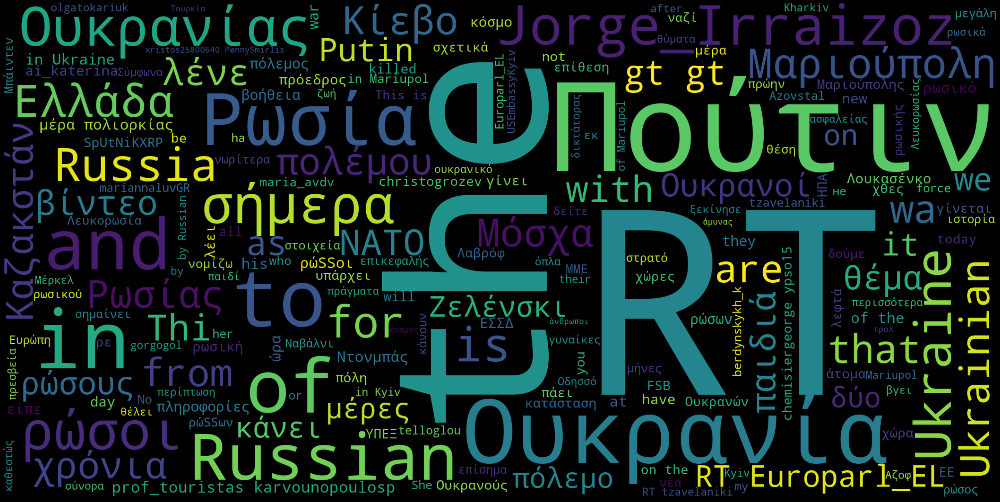

In [141]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words, 
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [142]:
from PIL import Image
import numpy as np

In [143]:
doc = nlp(Oni['text'][1])

In [144]:
for token in doc:
    print(token, token.lemma_)

Η ο
ταχύτητα ταχύτητα
με με
την ο
οποία οποίος
γεννιούνται γεννιούνται
τα ο
ρωsSS ρωsSS
ο-τρολ ο-τρολ
ακάου ακάου
ξεπερνάει ξεπερνάει
την ο
ταχύτητα ταχύτητα
με με
την ο
οποία οποίος
κάνω κάνω
πλοκ πλοκ
. .
Είναι είμαι
μια ένας
άνιση άνιση
μάχη μάχη
αλλά αλλά
δεν δεν
τα ο
παρατάω παρατάω
. .


In [145]:
' '.join(token.lemma_ for token in doc)

'ο ταχύτητα με ο οποίος γεννιούνται ο ρωsSS ο-τρολ ακάου ξεπερνάει ο ταχύτητα με ο οποίος κάνω πλοκ . είμαι ένας άνιση μάχη αλλά δεν ο παρατάω .'

In [146]:
text

'RT @pravda_eng Mother kisses her daughter for the last time at her funeral She died during the shelling in the village Bezruky, Kharkiv o…Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-τρολ ακάου ξεπερνάει την ταχύτητα με την οποία κάνω πλοκ Είναι μια άνιση μάχη αλλά δεν τα παρατάω@InfoWarriorNews άντε ρε πουλημένο τομάρι129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ  RT @Gerashchenko_en I keep thinking about this dog, red Fox Russians beat him up, broke his paws, threw him in the dumpster and mined him…Αγαπητά ρωSSo μποτ, πάρτε μάσα ζαχάροβα να γουστάρετε και καλό υπόλοιπο σκ  RT @DMokryk Eva Smulska, 8 years old Killed by a 🇷🇺Russian missile strike on the night of June 28th in 🇺🇦Ochakiv, Mykolaiv region She wa…Έχετε ακούσει για τη νέα ZVαστικα;128η μέρα εισβολής - Μάσα, πάει και το μπόρς  Η μάσα η ζαχάροβα θα είναι έξαλλη με τη Γιουνέσκο! Είναι εμφανές ότι οι νεο-ναζιστικές γραμμές των τρένων έχουν αποθρασυνθεί Αλλά ο γενναίος τσετσένος του Καντίροφ τους έδωσε να καταλάβουν τι σημαίνει

In [147]:
full_doc = nlp(text)
clear_text = ' '.join(token.lemma_ for token in full_doc)
clear_text[200:400]

'ερνάει ο ταχύτητα με ο οποίος κάνω πλοκ Είμαι ένας άνιση μάχη αλλά δεν ο παρατάω@InfoWarriorNews άντε ρε πουλημένο τομάρι129η μέρα εισβολή - θρίλερ με ο Λισιτσιάνκ   RT @Gerashchenko_en I keep thinkin'

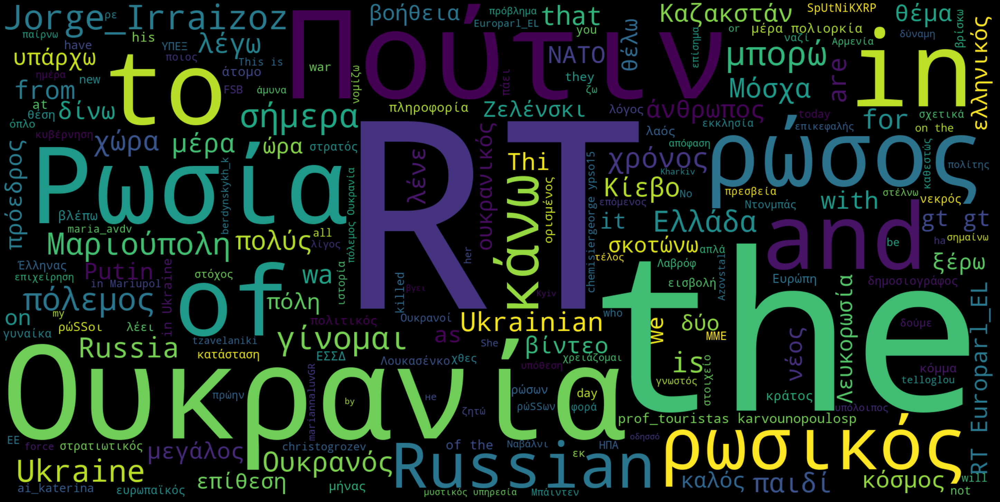

In [148]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [149]:
from collections import Counter
Counter(" ".join(Oni["text"]).split()).most_common(16)

[('και', 372),
 ('το', 336),
 ('να', 335),
 ('RT', 290),
 ('του', 283),
 ('της', 258),
 ('για', 245),
 ('από', 229),
 ('που', 208),
 ('την', 200),
 ('με', 196),
 ('η', 194),
 ('στην', 166),
 ('είναι', 160),
 ('στο', 158),
 ('ο', 156)]

In [150]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

οποιωνδήποτε


In [151]:
Oni['text_no_stopwords'] = Oni['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Oni['text_no_stopwords'] = Oni['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Oni['clean_text_no_stopwords'] = Oni['text']
#for stopword in nlp.Defaults.stop_words:
Oni['clean_text_no_stopwords'] = Oni['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Oni['clean_text_no_stopwords'] = Oni['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Oni['clean_text_no_stopwords'] = Oni['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Oni['clean_text_no_stopwords'] = Oni['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Oni['clean_text_no_stopwords'] = Oni['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Oni['clean_text_no_stopwords'] = Oni['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Oni['clean_text_no_stopwords'] = Oni['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())

In [152]:
freq = Counter(" ".join(Oni["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('RT', 290),
 ('the', 118),
 ('-', 93),
 ('in', 92),
 ('Η', 83),
 ('of', 83),
 ('Ο', 80),
 ('a', 75),
 ('Πούτιν', 75),
 ('Ουκρανία', 70),
 ('to', 66),
 ('Οι', 51),
 ('Το', 51),
 ('and', 49),
 ('Ρωσία', 49),
 ('is', 42)]

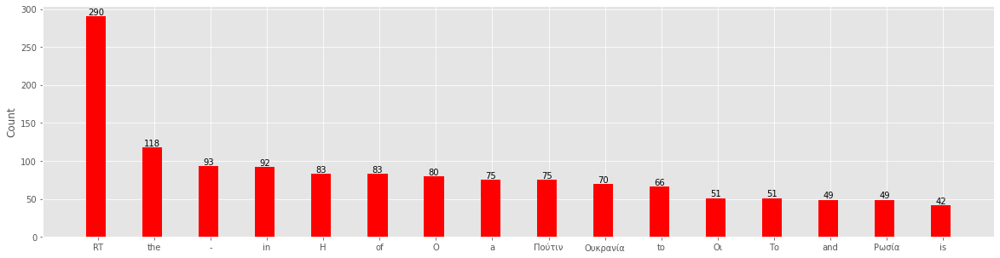

In [153]:
names, values = zip(*freq)
# names = [x[0] for x in data]  # These two lines are equivalent to the the zip-command.
# values = [x[1] for x in data] # These two lines are equivalent to the the zip-command.

ind = np.arange(len(freq))  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
# add some text for labels, title and axes ticks
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    # attach some text labels
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

# vectorizing Onisenko

In [154]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [155]:
count_vector = cv.fit_transform(Oni['text'])

In [156]:
count_vector.shape

(1127, 6769)

In [157]:
#cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,01,06,10,100,102,103,107,107η,...,чтобы,чудом,шандор,швейцарии,это,южно,як,які,європарламенту,ірпінь
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [158]:
#cv.vocabulary_

In [159]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [160]:
count_vector = cv.fit_transform(Oni['text'])

In [161]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,000,ai_katerina,amp,and,are,as,at,by,europarl_el,for,...,ρωσικής,ρωσικό,ρώssοι,ρώσοι,ρώσους,ρώσων,σήμερα,υπάρχει,χρόνια,ώρα
0,0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [162]:
from html import unescape
def my_tokenizer(doc):
            
    # apply the preprocessing and tokenzation steps
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    # use CountVectorizer's _word_ngrams built in method
    # to remove stop words and extract n-grams
    return(lemmatized_tokens)

In [163]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Oni['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['έκασε ο', 'έτερα', 'έτερων', 'ήσω', 'ίσιος', 'αλλιώ', 'αλλιώτικος', 'αλλοιώ', 'αρκετός', 'γίνομαι', 'γρήγορο', 'διο', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'επόμενος', 'εσένος', 'ετέραις', 'ετού', 'ετούε ο', 'εχτής', 'ιδίο', 'κάνενς', 'κάνω', 'κανενό', 'λοιπός', 'μέλλω', 'μερικός', 'μπορώ', 'μόνας', 'ολωσδιόλος', 'ορισμένος', 'οριόμενσς', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'ταύ', 'τουλάχισε ο', 'τρίτος', 'τός', 'χωριστό'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,...,@ai_katerina,@europarl_el,@jorge_irraizoz,@karvounopoulosp,@prof_touristas,@tzavelaniki,and,are,for,...,σήμερα,σε ο,σκοτώνω,στρατιωτικός,στρατός,υπάρχω,υπηρεσία,χρόνος,χώρα,ώρα
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [164]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Oni['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,and,gt,in,is,jorge_irraizoz,of,rt,russia,russian,the,to,ukraine,μέρα,μαριούπολη,ουκρανία,ουκρανίας,πούτιν,ρωσία,ρώσοι,σήμερα
0,0,0,1,0,0,0,1,0,0,3,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0


In [165]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\ουκ[α-ωά-ώ]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Oni['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ουκ,ουκασένκο,ουκρανία,ουκρανίας,ουκρανια,ουκρανικά,ουκρανικές,ουκρανική,ουκρανικής,ουκρανικού,ουκρανικό,ουκρανικών,ουκρανοί,ουκρανοι,ουκρανοποίηση,ουκρανού,ουκρανούς,ουκρανός,ουκρανών,ουκτρανική
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [166]:
results.sum(axis =0).sort_values(ascending = False)

ουκρανία         96
ουκρανίας        41
ουκρανοί         17
ουκασένκο        12
ουκρανούς        11
ουκρανών         10
ουκρανικό         8
ουκρανική         5
ουκρανικού        5
ουκρανοι          5
ουκρανικές        4
ουκρανικά         3
ουκρανια          2
ουκρανικών        2
ουκρανός          2
ουκ               1
ουκρανού          1
ουκρανοποίηση     1
ουκρανικής        1
ουκτρανική        1
dtype: int64

In [167]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()   

ουκρανία     96
ουκρανίας    41
ουκρανοί     17
ουκασένκο    12
ουκρανούς    11
dtype: int64

In [168]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bκ[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bκυβ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\bukraine[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Oni['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ukraine
0,0
1,0
2,0
3,0
4,0


In [169]:
results.sum(axis =0).sort_values(ascending = False)

ukraine    50
dtype: int64

In [170]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['Ukraine', 'Ουκρανία']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Oni['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,Ukraine,Ουκρανία
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [171]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [172]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(Oni['text'])  #finds the tfidf score with normalization

In [173]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,000,10,100,11,14,15,16,17,18,...,χρόνια,χρόνο,χτύπησαν,χώρα,χώρας,χώρες,όπλα,ώρα,на,не
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [174]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements


cosine scores ==>  [[1.         0.         0.         ... 0.         0.19491411 0.        ]]


In [175]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  #here the first element of tfidf_matrix_train is matched with other three elements


cosine scores ==>  [[1.         0.         0.         ... 0.         0.19491411 0.        ]
 [0.         1.         0.         ... 0.         0.         0.        ]
 [0.         0.         1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 1.         0.         0.        ]
 [0.19491411 0.         0.         ... 0.         1.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [176]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

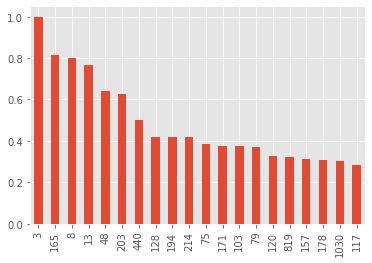

In [177]:
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [178]:
Oni['text'].loc[3]

'129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ  '

In [179]:
Oni['text'].loc[823]

'Είπε τώρα η Μαρία η Ζαχάροβα ότι η βρετανική κυβέρνηση έχει προσλάβει κόσμο για να διαδίδει αντιρωσική προπαγάνδα σε διάφορες χώρες, μεταξύ των οποίων ανέφερε και την Ελλάδα. Τον OPEN θα εννοεί μάλλον #Ουκρανία'

# Emolex Onidf

In [180]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [181]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [182]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)

In [183]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [184]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [185]:
Oni_tweets_df = pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/Oni.tsv", sep='\t')

In [186]:
len(Oni_tweets_df)

1127

In [187]:
short_tweets_Oni = Oni_tweets_df[['created_at','full_text' ]]
short_tweets_Oni = short_tweets_Oni.rename(columns={'created_at': 'date', 'full_text': 'text'} )

In [188]:
short_tweets_Oni.tail()

,date,text
1122,Wed Apr 01 14:20:11 +0000 2020,Έγραψα ένα βίντεο για τον ρόλο των μυστικών υπ...
1123,Fri Sep 06 18:44:05 +0000 2019,RT @KappaNewsGr: Βασικός ύποπτος στην υπόθεση ...
1124,Mon Apr 28 14:06:07 +0000 2014,@POPOVRTR Международная журналистика вас не за...
1125,Mon Apr 28 13:43:39 +0000 2014,Simon Ostrovsky tells the full story of his ab...
1126,Mon Feb 24 18:26:55 +0000 2014,Στο μπλόκο! http://t.co/o7jiqGUNqr


In [189]:
short_tweets_Oni.dtypes

date    object
text    object
dtype: object

In [190]:
short_tweets_Oni['date'] = pd.to_datetime(short_tweets_Oni['date'], format='%a %b %d %H:%M:%S +0000 %Y')

In [191]:
short_tweets_Oni['year'] = pd.DatetimeIndex(short_tweets_Oni['date']).year
short_tweets_Oni['month'] = pd.DatetimeIndex(short_tweets_Oni['date']).month
short_tweets_Oni['day'] = pd.DatetimeIndex(short_tweets_Oni['date']).day
short_tweets_Oni

,date,text,year,month,day
0,2022-07-03 07:24:33,RT @pravda_eng: Mother kisses her daughter for...,2022,7,3
1,2022-07-02 21:32:11,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...,2022,7,2
2,2022-07-02 21:21:17,@InfoWarriorNews άντε ρε πουλημένο τομάρι,2022,7,2
3,2022-07-02 19:18:38,129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ h...,2022,7,2
4,2022-07-02 18:08:40,RT @Gerashchenko_en: I keep thinking about thi...,2022,7,2
...,...,...,...,...,...
1122,2020-04-01 14:20:11,Έγραψα ένα βίντεο για τον ρόλο των μυστικών υπ...,2020,4,1
1123,2019-09-06 18:44:05,RT @KappaNewsGr: Βασικός ύποπτος στην υπόθεση ...,2019,9,6
1124,2014-04-28 14:06:07,@POPOVRTR Международная журналистика вас не за...,2014,4,28
1125,2014-04-28 13:43:39,Simon Ostrovsky tells the full story of his ab...,2014,4,28


In [192]:
short_tweets_Oni.dtypes

date     datetime64[ns]
text             object
year              int64
month             int64
day               int64
dtype: object

In [193]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [194]:
short_tweets_Oni['text'] = short_tweets_Oni['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [195]:
short_tweets_Oni.head()

,date,text,year,month,day
0,2022-07-03 07:24:33,RT @pravda_eng: Mother kisses her daughter for...,2022,7,3
1,2022-07-02 21:32:11,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...,2022,7,2
2,2022-07-02 21:21:17,@InfoWarriorNews άντε ρε πουλημένο τομάρι,2022,7,2
3,2022-07-02 19:18:38,129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ,2022,7,2
4,2022-07-02 18:08:40,RT @Gerashchenko_en: I keep thinking about thi...,2022,7,2


In [196]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [197]:
#from sklearn.feature_extraction.text import TfidfVectorizer
#CountVectorizer(stop_words='english', binary=True)
# Θέλω να ελέγξω μόνο τις λέξεις που υπάρχουν στο συναισθηματικό λεξικό

#CountVectorizer(analyzer = 'word', 
#              strip_accents = 'unicode', 
#               token_pattern='[Α-Ωα-ωΆ-Ώά-ώ]{2,}', 
#               stop_words= lc_stop_words_df['stop_w'].tolist())


matrix = vec.fit_transform(short_tweets_Oni['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [198]:
wordcount_df.shape

(1127, 13161)

In [199]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [200]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [201]:
# Φτιάξε μια λίστα με positive words

angry_words = emolex_df[emolex_df.Anger == 1]['word']

positive_words = emolex_df[emolex_df.Positive == 1]['word']


# Φτιάξε μια λίστα με sadness words
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']


# Φτιάξε μια λίστα με surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']


# Φτιάξε μια λίστα με disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']


# Φτιάξε μια λίστα με anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']


# Φτιάξε μια λίστα με negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']



# Φτιάξε μια λίστα με joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']


# Φτιάξε μια λίστα με trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']



# Φτιάξε μια λίστα με fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']


In [202]:
short_tweets_Oni.head(3)

,date,text,year,month,day
0,2022-07-03 07:24:33,RT @pravda_eng: Mother kisses her daughter for...,2022,7,3
1,2022-07-02 21:32:11,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...,2022,7,2
2,2022-07-02 21:21:17,@InfoWarriorNews άντε ρε πουλημένο τομάρι,2022,7,2


In [203]:
short_tweets_Oni['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_Oni['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_Oni['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_Oni['disgust'] = wordcount_df[disgust_words].sum(axis=1)


short_tweets_Oni['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_Oni['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_Oni['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_Oni['sadness'] = wordcount_df[sadness_words].sum(axis=1)

short_tweets_Oni['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_Oni['fear'] = wordcount_df[fear_words].sum(axis=1)


In [204]:
short_tweets_Oni

,date,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
0,2022-07-03 07:24:33,RT @pravda_eng: Mother kisses her daughter for...,2022,7,3,0,0,0,0,0,0,0,0,0,0
1,2022-07-02 21:32:11,Η ταχύτητα με την οποία γεννιούνται τα ρωsSSο-...,2022,7,2,1,2,0,0,3,0,0,1,2,2
2,2022-07-02 21:21:17,@InfoWarriorNews άντε ρε πουλημένο τομάρι,2022,7,2,0,0,0,0,0,0,0,0,0,0
3,2022-07-02 19:18:38,129η μέρα εισβολής - θρίλερ με το Λισιτσιάνκ,2022,7,2,0,0,0,0,0,0,0,0,0,0
4,2022-07-02 18:08:40,RT @Gerashchenko_en: I keep thinking about thi...,2022,7,2,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1122,2020-04-01 14:20:11,Έγραψα ένα βίντεο για τον ρόλο των μυστικών υπ...,2020,4,1,0,1,1,0,1,1,1,0,0,0
1123,2019-09-06 18:44:05,RT @KappaNewsGr: Βασικός ύποπτος στην υπόθεση ...,2019,9,6,1,0,0,0,1,0,2,1,2,2
1124,2014-04-28 14:06:07,@POPOVRTR Международная журналистика вас не за...,2014,4,28,0,0,0,0,0,0,0,0,0,0
1125,2014-04-28 13:43:39,Simon Ostrovsky tells the full story of his ab...,2014,4,28,0,0,0,0,0,0,0,0,0,0


In [205]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_Oni)):
  #print(short_tweets_Oni.iloc[i]['positivity'])
  if short_tweets_Oni.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_Oni.iloc[i]['text']
    max = short_tweets_Oni.iloc[i]['positivity']


happiest_tweet

'RT @tzavelaniki: Η σκηνή με τον Πούτιν στην εκκλησία για την Ανάσταση, τελικά ήταν σκηνοθετημένη σε άδεια εκκλησία , όπου τραβήχτηκε το βίν…'

In [206]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_Oni)):
  #print(short_tweets_Oni.iloc[i]['positivity'])
  if short_tweets_Oni.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_Oni.iloc[i]['text']
    max = short_tweets_Oni.iloc[i]['negative']


negative_tweet

'@SpUtNiKXRP δεν είναι ώρα για να συζητήσουμε τον ιστορικό ρόλο του  UPA ή κάποιοι άλλου. Εσείς βλέπετε το θέμα από τη δική σας σκοπιά, άλλοι από διαφορετική. Συγγνώμη που τα "κάναμε χάλια" και λερώσαμε το χαλί σας το αίμα μας. Τέλος συζήτησης.'

In [207]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_Oni)):
  #print(short_tweets_Oni.iloc[i]['positivity'])
  if short_tweets_Oni.iloc[i]['sadness'] > max:
    saddest_tweet = short_tweets_Oni.iloc[i]['text']
    max = short_tweets_Oni.iloc[i]['sadness']

saddest_tweet

'Ακριβώς πριν 60 χρόνια, αφαιρέθηκε το μουμιοποιημένο πτώμα του δικτάτορα Ιωσήφ Τζουγκασβίλι (aka Στάλιν) από το μαυσωλείο στην Κόκκινη Πλατεία. Η μεταφορά και η ταφή έγιναν κρυφά, κατά τη διάρκεια νύχτας, σε άγνωστη τοποθεσία χωρίς διακριτικά. Όπως αξίζει σε ένα λυσσασμένο σκυλί.  '

In [208]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_Oni)):
  #print(short_tweets_Oni.iloc[i]['positivity'])
  if short_tweets_Oni.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_Oni.iloc[i]['text']
    max = short_tweets_Oni.iloc[i]['fear']

fear_tweet

'Την ώρα που ο «ένδοξος ρωσικός στρατός» σκοτώνει αμάχους Ουκρανούς, στην ίδια τη ρωσία γίνεται ένας άλλος πόλεμος. Ο πόλεμος της ζάχαρης  '

In [209]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_Oni)):
  #print(short_tweets_Oni.iloc[i]['positivity'])
  if short_tweets_Oni.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_Oni.iloc[i]['text']
    max = short_tweets_Oni.iloc[i]['trust']

trust_tweet

'RT @tzavelaniki: Η σκηνή με τον Πούτιν στην εκκλησία για την Ανάσταση, τελικά ήταν σκηνοθετημένη σε άδεια εκκλησία , όπου τραβήχτηκε το βίν…'

In [210]:
short_tweets_Oni.set_index('date' , inplace=True)

In [211]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

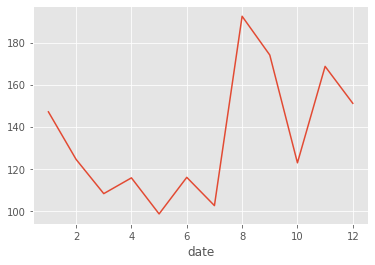

In [212]:
short_tweets_Oni['text'].str.len().groupby(by=short_tweets_Oni.index.month).mean().plot()

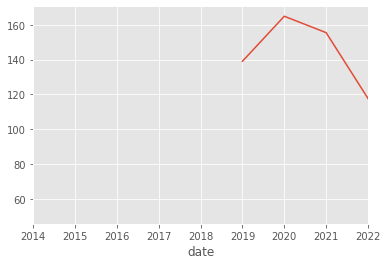

In [213]:
short_tweets_Oni['text'].str.len().resample('A').mean().plot() 

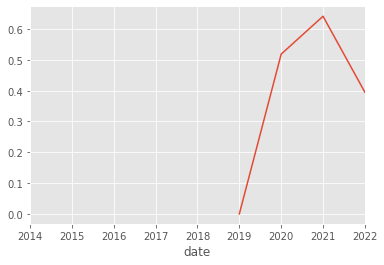

In [214]:
short_tweets_Oni['positivity'].resample('A').mean().plot() 

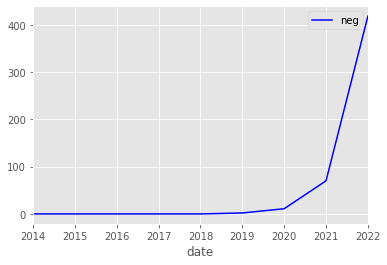

In [215]:
short_tweets_Oni['negative'].resample('A').sum().plot(color = 'b',label = 'neg').legend() 

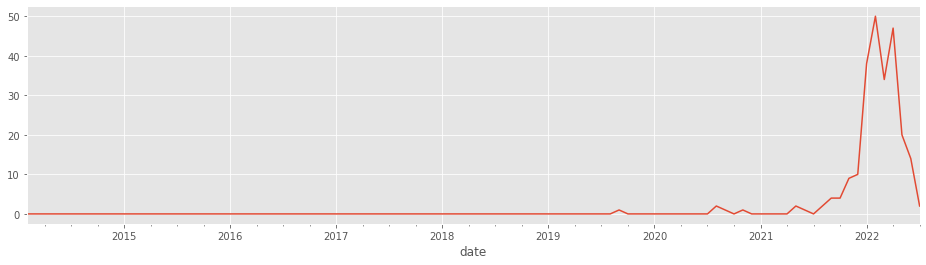

In [216]:
short_tweets_Oni['anger'].resample('M').sum().plot(figsize=(16,4))

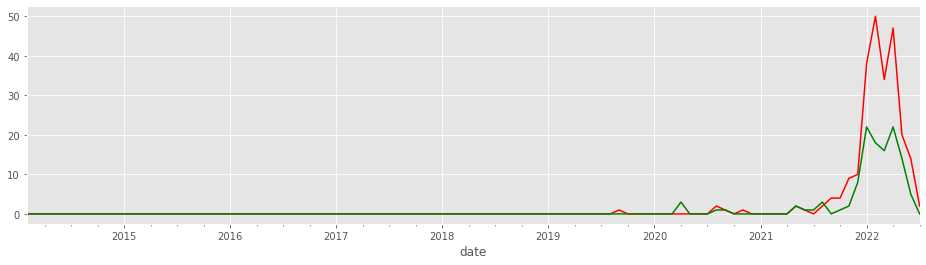

In [217]:
ax = short_tweets_Oni['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Oni['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

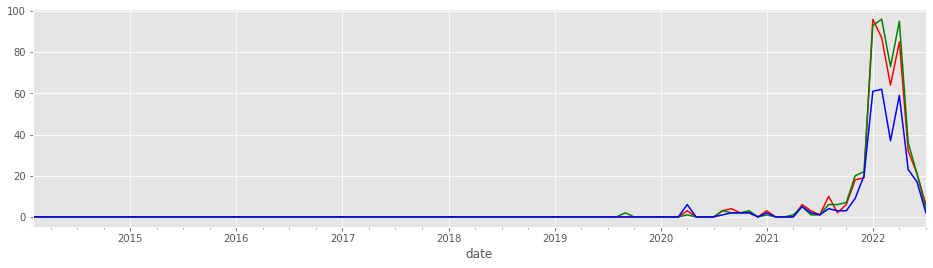

In [218]:
ax = short_tweets_Oni['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Oni['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Oni['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')

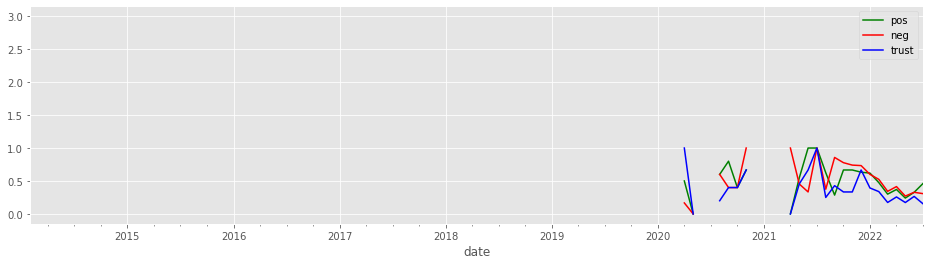

In [219]:
ax = short_tweets_Oni['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Oni['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Oni['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

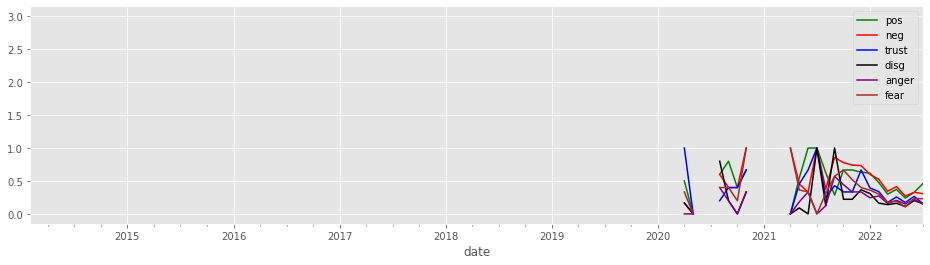

In [220]:
plt.style.use('ggplot')
ax = short_tweets_Oni['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos')
short_tweets_Oni['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'r')
short_tweets_Oni['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'blue').legend()

short_tweets_Oni['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

short_tweets_Oni['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'purple').legend() 

short_tweets_Oni['fear'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

Text(0, 0.5, 'Years')

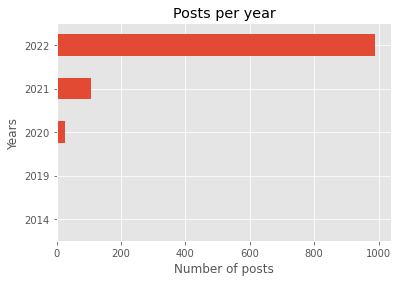

In [221]:
short_tweets_Oni['text'].groupby(by=short_tweets_Oni.index.year).count().plot(kind='barh')
plt.title("Posts per year")
plt.xlabel("Number of posts")
plt.ylabel("Years")

Text(0, 0.5, 'Month of the year')

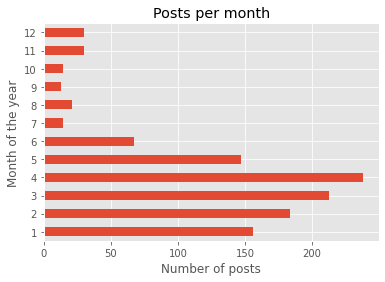

In [222]:
short_tweets_Oni['text'].groupby(by=short_tweets_Oni.index.month).count().plot(kind='barh')
plt.title("Posts per month")
plt.xlabel("Number of posts")
plt.ylabel("Month of the year")

Text(0, 0.5, 'Hour of the day')

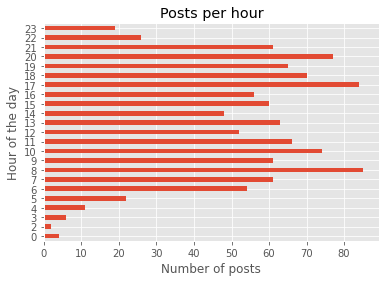

In [223]:
short_tweets_Oni['text'].groupby(by=short_tweets_Oni.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

# Avgerdf - Onidf

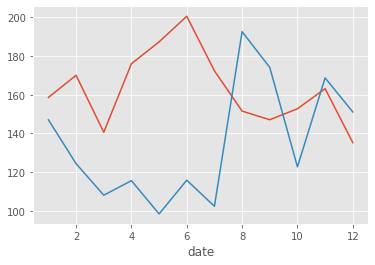

In [224]:
short_tweets_Avger['text'].str.len().groupby(by=short_tweets_Avger.index.month).mean().plot()
short_tweets_Oni['text'].str.len().groupby(by=short_tweets_Oni.index.month).mean().plot()

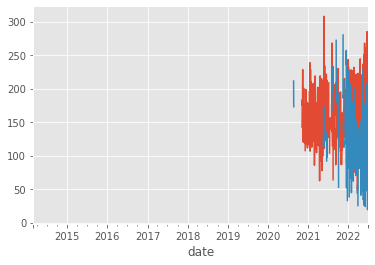

In [225]:
short_tweets_Avger['text'].str.len().resample('D').mean().plot() 
short_tweets_Oni['text'].str.len().resample('D').mean().plot() 

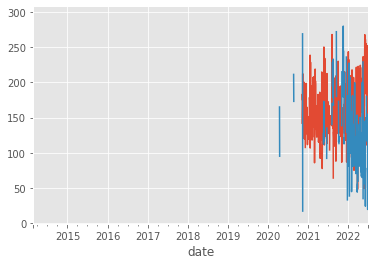

In [226]:
short_tweets_Avger['text'].str.len().resample('B').mean().plot() 
short_tweets_Oni['text'].str.len().resample('B').mean().plot() 

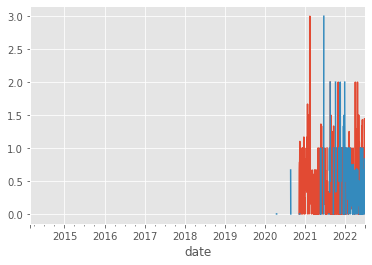

In [227]:
short_tweets_Avger['positivity'].resample('B').mean().plot() 
short_tweets_Oni['positivity'].resample('B').mean().plot() 

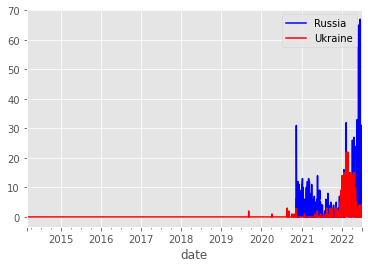

In [228]:
short_tweets_Avger['negative'].resample('B').sum().plot(color = 'b',label = 'Russia').legend() 
short_tweets_Oni['negative'].resample('B').sum().plot(color = 'r',label = 'Ukraine').legend() 

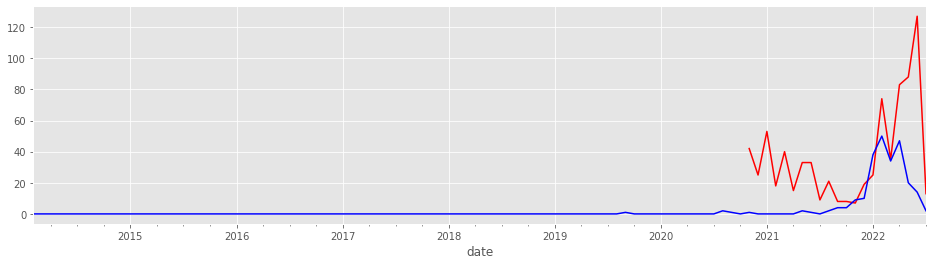

In [229]:
short_tweets_Avger['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Oni['anger'].resample('M').sum().plot(figsize=(16,4), color = 'blue')

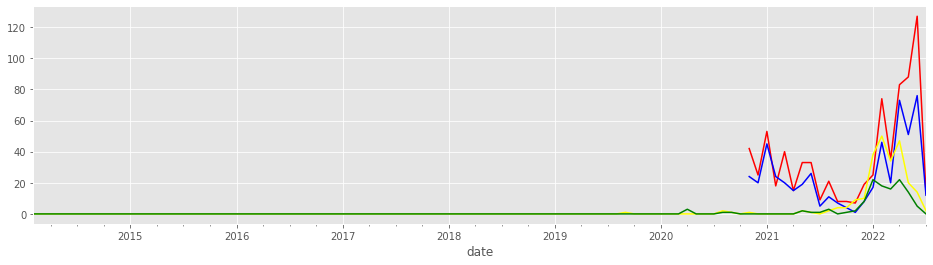

In [230]:
ax = short_tweets_Avger['anger'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Avger['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = short_tweets_Oni['anger'].resample('M').sum().plot(figsize=(16,4), color = 'yellow')
short_tweets_Oni['joy'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')

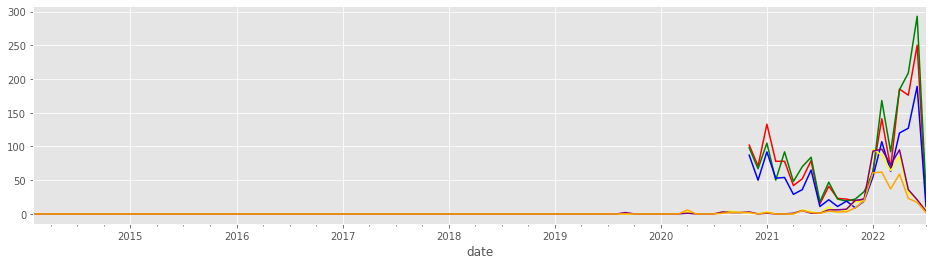

In [231]:
ax = short_tweets_Avger['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'red')
short_tweets_Avger['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'green')
short_tweets_Avger['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ax = short_tweets_Oni['positivity'].resample('M').sum().plot(figsize=(16,4), color = 'yellow')
short_tweets_Oni['negative'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'purple')
short_tweets_Oni['trust'].resample('M').sum().plot(figsize=(16,4), ax = ax, color = 'orange')

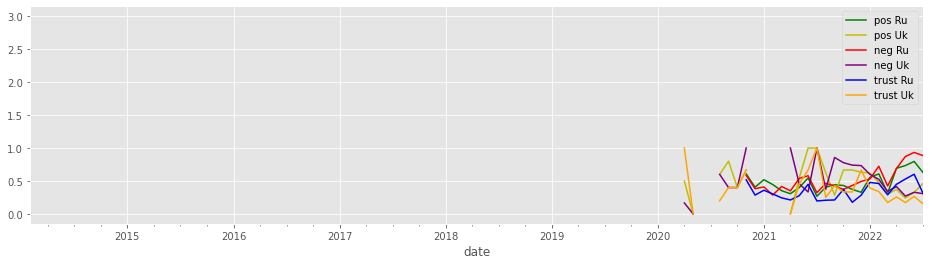

In [232]:
ax = short_tweets_Avger['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
ax = short_tweets_Oni['positivity'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'y', label='pos Uk')
short_tweets_Avger['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
short_tweets_Oni['negative'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'purple')
short_tweets_Avger['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()
short_tweets_Oni['trust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'orange').legend()

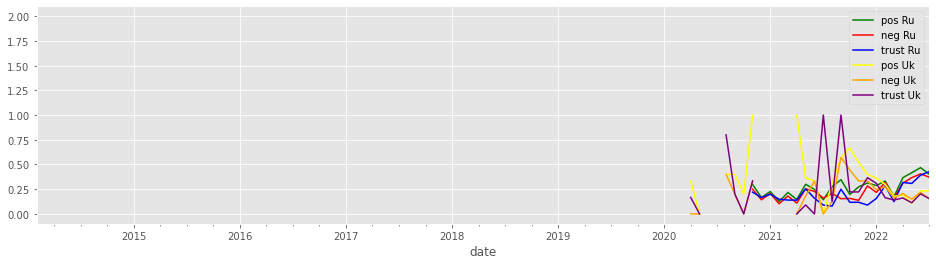

In [233]:
plt.style.use('ggplot')
ax = short_tweets_Avger['fear'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'g', label='pos Ru')
short_tweets_Avger['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Ru', color = 'r')
short_tweets_Avger['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Ru',color = 'blue').legend()    
short_tweets_Oni['fear'].resample('M').mean().plot(figsize=(16,4), 
                                                          color = 'yellow', label='pos Uk')
short_tweets_Oni['anger'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg Uk', color = 'orange')
short_tweets_Oni['disgust'].resample('M').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust Uk',color = 'purple').legend()                                                